This is the main analysis on multiple independent variables on years to equate, please scroll down as the first cells are the data processing part. (cell In [17]:)

In [1]:
import pandas as pd
import statsmodels.api as sm
from scipy import stats
import numpy as np
from scipy.io import loadmat

from itertools import chain, combinations
pd.options.display.max_rows = 999
from IPython.display import display
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
from matplotlib import pyplot
import plotly.express as px
from scipy.spatial.distance import cdist
from scipy.stats import ttest_rel

In [2]:
X = pd.read_csv('MERGED2019_20_PP.csv',low_memory=False)
X10to19 = loadmat('10to19.mat')
Y = pd.read_csv('results.csv')   # this is same attrition rate for all levels
X_rank = pd.read_csv('qs 2020.csv')
female_president = pd.read_csv('female president.csv', encoding= 'unicode_escape')
university_list = pd.read_csv('university_list_r1_r2.csv')

In [3]:
university_list["promotion rate male1"] = X10to19["promotion_rate_m_list"][:,0]
university_list["promotion rate male2"] = X10to19["promotion_rate_m_list"][:,1]
university_list["attrition rate male"] = X10to19["attrition_rate_m_list"][:,0]
university_list["attrition rate female"] = X10to19["attrition_rate_f_list"][:,0]
university_list["promotion rate female 1"] = X10to19["promotion_rate_f_list"][:,0]
university_list["promotion rate female 2"] = X10to19["promotion_rate_f_list"][:,1]

university_list["100 bottom diff"] = X10to19["time_to_equate"][:,0]
university_list["75 bottom diff"] = X10to19["time_to_equate"][:,1]
university_list["100 all diff"] = X10to19["time_to_equate"][:,2]
university_list["75 all diff"] = X10to19["time_to_equate"][:,3]
university_list["100 bottom same"] = X10to19["time_to_equate"][:,4]
university_list["75 bottom same"] = X10to19["time_to_equate"][:,5]
university_list["100 all same"] = X10to19["time_to_equate"][:,6]
university_list["75 all same"] = X10to19["time_to_equate"][:,7]

In [4]:
X10to19 = university_list
X10to19.head()

,UNITID,name,promotion rate male1,promotion rate male2,attrition rate male,attrition rate female,promotion rate female 1,promotion rate female 2,100 bottom diff,75 bottom diff,100 all diff,75 all diff,100 bottom same,75 bottom same,100 all same,75 all same
0,100663,University of Alabama at Birmingham,0.087903,0.101896,0.037872,0.016559,0.065697,0.094162,25,29,20,27,23,27,19,26
1,100751,The University of Alabama,0.194251,0.125842,0.104818,0.116801,0.172548,0.068275,18,27,10,18,15,22,8,14
2,100858,Auburn University,0.101670,0.038954,0.046619,0.033702,0.097844,0.033898,30,37,19,29,28,35,18,28
3,104151,Arizona State University Campus Immersion,0.134233,0.077234,0.085324,0.104780,0.133127,0.073987,22,35,10,21,22,34,10,20
4,104179,University of Arizona,0.073065,0.040802,0.034150,0.019375,0.077694,0.059723,26,30,18,33,30,35,21,31


In [5]:
Y_new = X10to19[X10to19["UNITID"].isin(Y.UNITID.tolist())]

In [6]:
#Y_new.to_csv("results10to19.csv")
Y_new = pd.read_csv('results10to19.csv')

In [7]:
female_president.head()

,UNITID,Name,women president duration,women president in system,women president 2012-2019,women president before 2012,women president ever
0,200697,Air Force Institute of Technology-Graduate Sch...,0,NaN,0,0,0
1,131159,American University,2017¨Cpresent,NaN,1,0,1
2,104151,Arizona State University Campus Immersion,0,NaN,0,0,0
3,483124,Arizona State University Digital Immersion,0,NaN,0,0,0
4,448886,Arizona State University-Downtown Phoenix,0,NaN,0,0,0


In [8]:
X.head()

,UNITID,OPEID,OPEID6,INSTNM,CITY,STABBR,ZIP,ACCREDAGENCY,INSTURL,NPCURL,...,FEDSCHCD,BOOKSUPPLY,ROOMBOARD_ON,OTHEREXPENSE_ON,ROOMBOARD_OFF,OTHEREXPENSE_OFF,OTHEREXPENSE_FAM,ENDOWBEGIN,ENDOWEND,DOLPROVIDER
0,100654,100200,1002,Alabama A & M University,Normal,AL,35762,Southern Association of Colleges and Schools C...,www.aamu.edu/,www.aamu.edu/admissions-aid/tuition-fees/net-p...,...,1002,1600.0,9240.0,3090.0,9240.0,3090.0,3090.0,NaN,NaN,0
1,100663,105200,1052,University of Alabama at Birmingham,Birmingham,AL,35294-0110,Southern Association of Colleges and Schools C...,https://www.uab.edu/,https://uab.studentaidcalculator.com/survey.aspx,...,1052,1200.0,12307.0,5555.0,12307.0,5555.0,5555.0,524675419.0,537349307.0,0
2,100690,2503400,25034,Amridge University,Montgomery,AL,36117-3553,Southern Association of Colleges and Schools C...,www.amridgeuniversity.edu/,www2.amridgeuniversity.edu:9091/,...,16885,900.0,NaN,NaN,9600.0,1600.0,1600.0,174804.0,174805.0,0
3,100706,105500,1055,University of Alabama in Huntsville,Huntsville,AL,35899,Southern Association of Colleges and Schools C...,www.uah.edu/,finaid.uah.edu/,...,1055,2120.0,10400.0,3994.0,10400.0,3994.0,3994.0,79465021.0,77250279.0,1
4,100724,100500,1005,Alabama State University,Montgomery,AL,36104-0271,Southern Association of Colleges and Schools C...,www.alasu.edu/,www.alasu.edu/cost-aid/tuition-costs/net-price...,...,1005,1600.0,6050.0,3392.0,7320.0,4228.0,4228.0,99638681.0,94536751.0,0


In [9]:
Y_new.head()
Y=Y_new

In [10]:
Y_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182 entries, 0 to 181
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               182 non-null    int64  
 1   UNITID                   182 non-null    int64  
 2   name                     182 non-null    object 
 3   promotion rate male1     182 non-null    float64
 4   promotion rate male2     182 non-null    float64
 5   attrition rate male      182 non-null    float64
 6   attrition rate female    182 non-null    float64
 7   promotion rate female 1  182 non-null    float64
 8   promotion rate female 2  182 non-null    float64
 9   100 bottom diff          182 non-null    int64  
 10  75 bottom diff           182 non-null    int64  
 11  100 all diff             182 non-null    int64  
 12  75 all diff              182 non-null    int64  
 13  100 bottom same          182 non-null    int64  
 14  75 bottom same           1

In [11]:
Y_new['diff 1'] = Y_new['promotion rate male1']-Y_new['promotion rate female 1']
Y_new['diff 2'] = Y_new['promotion rate male2']-Y_new['promotion rate female 2']

In [12]:
data_df = pd.merge(Y_new, X, on='UNITID', how='left')
data_df = pd.merge(data_df,female_president,on='UNITID',how='left')

rank_df = pd.merge(Y_new, X_rank, on='UNITID', how='left')

In [13]:
rank_df.head()

,Unnamed: 0,UNITID,name,promotion rate male1,promotion rate male2,attrition rate male,attrition rate female,promotion rate female 1,promotion rate female 2,100 bottom diff,75 bottom diff,100 all diff,75 all diff,100 bottom same,75 bottom same,100 all same,75 all same,diff 1,diff 2,qs
0,0,100663,University of Alabama at Birmingham,0.087903,0.101896,0.037872,0.016559,0.065697,0.094162,25,29,20,27,23,27,19,26,0.022206,0.007734,NaN
1,1,100751,The University of Alabama,0.194251,0.125842,0.104818,0.116801,0.172548,0.068275,18,27,10,18,15,22,8,14,0.021703,0.057567,NaN
2,2,100858,Auburn University,0.101670,0.038954,0.046619,0.033702,0.097844,0.033897,30,37,19,29,28,35,18,28,0.003826,0.005056,139.0
3,3,104151,Arizona State University Campus Immersion,0.134233,0.077234,0.085324,0.104780,0.133127,0.073987,22,35,10,21,22,34,10,20,0.001106,0.003247,50.0
4,4,104179,University of Arizona,0.073065,0.040802,0.034150,0.019375,0.077694,0.059723,26,30,18,33,30,35,21,31,-0.004629,-0.018921,55.0


In [14]:
# constructing a set of continuous IVs
IVs2 = data_df[['UNITID','ADM_RATE','UGDS','NPT4_PUB','NPT4_PRIV','SAT_AVG','C150_4']]

IVs2.NPT4_PUB = IVs2[['NPT4_PUB','NPT4_PRIV']].max(axis=1)

IVs2.drop('NPT4_PRIV', axis=1, inplace=True)


IVs2 = IVs2.dropna()

In [15]:
# constructing a set of discrete IVs
IVs = data_df[['UNITID','CONTROL','REGION','LOCALE','CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI','STABBR','women president 2012-2019','women president before 2012']]

IVs = IVs.dropna()

In [16]:
# constructing a set of all IVs
IVsall = data_df[['UNITID','CONTROL','REGION','LOCALE','CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI','ADM_RATE','UGDS','NPT4_PUB','NPT4_PRIV','SAT_AVG','C150_4','women president 2012-2019','women president before 2012']]

IVsall.NPT4_PUB = IVsall[['NPT4_PUB','NPT4_PRIV']].max(axis=1)

IVsall.drop('NPT4_PRIV', axis=1, inplace=True)


IVsall = IVsall.dropna()

In [17]:
def match_samples(X1, X2, Y1, Y2):
    
    distances = cdist(Y1, Y2, metric='euclidean')
    matches = np.argmin(distances, axis=1)
    return X1, X2.iloc[matches]

def matched_ttest(c1,reg_data,col_name):
    X1 = reg_data.loc[reg_data[col_name]==c1][var_name]
    X2 = reg_data.loc[reg_data[col_name]!=c1][var_name]
    Y1 = reg_data.loc[reg_data[col_name]==c1,reg_data.columns != var_name]
    Y2 = reg_data.loc[reg_data[col_name]!=c1,reg_data.columns != var_name]
    
    matched_X1, matched_X2 = match_samples(X1, X2, Y1, Y2)
    t_stat, p_value = ttest_rel(matched_X1, matched_X2)
    return t_stat, p_value

In [18]:
def ttest_run(c1, c2,reg_data,col_name):
    data1 = reg_data.loc[reg_data[col_name]==c1][var_name]
    data2 = reg_data.loc[reg_data[col_name]==c2][var_name]
    
    results = stats.ttest_ind(data1, data2)
    df = pd.DataFrame({'group by var':col_name,
                       'categ1': c1,
                       'categ2': c2,
                       'tstat': results.statistic,
                       'pvalue': results.pvalue}, 
                       index = [0])    
    return df

In [19]:
def highlight_005(row):

    color = 'white'
    if row.pvalue <= 0.05:
        color = 'red'
    elif row.pvalue<=0.1:
        color = 'yellow'

    return ['background-color: %s' % color]*len(row.values)

In [20]:
def disp_result(var_name):
    DV1 = Y[['UNITID',var_name]]

    indexes = DV1[ (DV1[var_name] == 0) | (DV1[var_name]>1000) ].index

    #indexes = DV1[ (DV1[var_name] == 0)].index

    DV1 = DV1.drop(indexes)
    reg_data = pd.merge(DV1,IVs,on='UNITID',how = 'inner')
    reg_data = reg_data.drop(columns=['UNITID'])
    
    DV1_rank = Y[['UNITID',var_name]]
    
    reg_data_rank = pd.merge(DV1_rank,X_rank,on='UNITID',how = 'inner')
    reg_data_rank = reg_data_rank.drop(columns=['UNITID'])
    
    
    for col in ['CONTROL','REGION',"LOCALE",'CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('int')
    # plot average year to equate by region
    New_england = ['CT','ME','MA','NH','RI','VT'] #1
    Mid_east = ['DE','DC','MD','NJ','NY','PA']    #2
    Great_lakes = ['IL','IN','MI','OH','WI']      #3
    Plains = ['IA','KS','MN','MO','NE','ND','SD'] #4
    Southeast = ['AL','AR','FL','GA','KY','LA','MS','NC','SC','TN','VA','WV'] #5
    Southwest = ['AZ','NM','OK','TX']             #6
    Rocky = ['CO','ID','MT','UT','WY']            #7
    Far_west = ['AK','CA','HI','NV','OR','WA']    #8
    Outlying = ['AS','FM','GU','MH','MP','PR','RW','VI'] #9
    

    Region1 = np.mean(reg_data.loc[reg_data.REGION==1][var_name])
    Region2 = np.mean(reg_data.loc[reg_data.REGION==2][var_name])
    Region3 = np.mean(reg_data.loc[reg_data.REGION==3][var_name])
    Region4 = np.mean(reg_data.loc[reg_data.REGION==4][var_name])
    Region5 = np.mean(reg_data.loc[reg_data.REGION==5][var_name])
    Region6 = np.mean(reg_data.loc[reg_data.REGION==6][var_name])
    Region7 = np.mean(reg_data.loc[reg_data.REGION==7][var_name])
    Region8 = np.mean(reg_data.loc[reg_data.REGION==8][var_name])

    locations = New_england+Mid_east+Great_lakes+Plains+Southeast+Southwest+Rocky+Far_west
    color = [Region1]*len(New_england)+[Region2]*len(Mid_east)+[Region3]*len(Great_lakes)+[Region4]*len(Plains)+[Region5]*len(Southeast)+[Region6]*len(Southwest)+[Region7]*len(Rocky)+[Region8]*len(Far_west)


    fig = px.choropleth(locations=locations, locationmode="USA-states", color=color, scope="usa",color_continuous_scale='Blues',title='Average '+var_name+' by REGION')
    fig.show()
    
    states = []
    colors = []
    for s in locations:
        if np.mean(reg_data.loc[reg_data.STABBR==s][var_name])>0:
            states.append(s)
            colors.append(np.mean(reg_data.loc[reg_data.STABBR==s][var_name]))
            
    fig = px.choropleth(locations=states, locationmode="USA-states", color=colors, scope="usa",color_continuous_scale='Burg',title='Average '+var_name+' by state')
    fig.show()
    
    ttest_0 = stats.ttest_1samp(reg_data[var_name],0).pvalue
    print('p-value for t test against 0:'+str(np.round_(ttest_0,decimals=5)))
    
    reg_data = reg_data.drop(columns=['STABBR'])
    t_stat, p_value = matched_ttest(16,reg_data,'CCBASIC')
    s = 'matched t test p-value on ccbasic:'+str(np.round_(p_value,decimals=5))
    print(s)
    ccbasic_16 = reg_data.loc[reg_data.CCBASIC==16][var_name]
    ccbasic_else = reg_data.loc[reg_data.CCBASIC!=16][var_name]
    print(len(ccbasic_16))
    print(len(ccbasic_else))
    s = 't test p-value on ccbasic:'+str(np.round_(stats.ttest_ind(ccbasic_16, ccbasic_else).pvalue,decimals=5))
    n_bins = 15
    

    bins = np.linspace(0, 500, 50)

    pyplot.hist(ccbasic_16,n_bins,alpha=0.5,density=True,label=" R2 schools, average="+str(np.round_(np.mean(ccbasic_16),decimals=3)))
    pyplot.hist(ccbasic_else,n_bins,alpha=0.5,density=True,label="R1 schools, average="+str(np.round_(np.mean(ccbasic_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for R1/R2 schools, '+s)
    pyplot.show()
    
    
    

    control_2 = reg_data.loc[reg_data.CONTROL==2][var_name]
    control_else = reg_data.loc[reg_data.CONTROL!=2][var_name]
    t_stat, p_value = matched_ttest(2,reg_data,'CONTROL')
    s = 'matched t test p-value on control:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test p-value on control:'+str(np.round_(stats.ttest_ind(control_2, control_else).pvalue,decimals=5))
    bins = np.linspace(0, 500, 50)
    
    pyplot.hist(control_2,n_bins,alpha=0.5,density=True,label="private schools, average="+str(np.round_(np.mean(control_2),decimals=3)))
    pyplot.hist(control_else,n_bins,alpha=0.5,density=True,label="public schools, average="+str(np.round_(np.mean(control_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for private/public schools, '+s)
    pyplot.show()
    
    
    
    AANAPII_1 = reg_data.loc[reg_data.AANAPII==1][var_name]
    AANAPII_else = reg_data.loc[reg_data.AANAPII!=1][var_name]
    t_stat, p_value = matched_ttest(1,reg_data,'AANAPII')
    s = 'matched t test p-value on control:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test p-value on AANAPII:'+str(np.round_(stats.ttest_ind(AANAPII_1, AANAPII_else).pvalue,decimals=5))
    pyplot.hist(AANAPII_1,n_bins,alpha=0.5,density=True,label="AANAPII schools, average="+str(np.round_(np.mean(AANAPII_1),decimals=3)))
    pyplot.hist(AANAPII_else,n_bins,alpha=0.5,density=True,label="other schools, average="+str(np.round_(np.mean(AANAPII_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for AANAPII/other schools, '+s)
    pyplot.show()

    HSI_1 = reg_data.loc[reg_data.HSI==1][var_name]
    HSI_else = reg_data.loc[reg_data.HSI!=1][var_name]
    t_stat, p_value = matched_ttest(1,reg_data,'HSI')
    s = 'matched t test p-value on control:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test on HSI:'+str(stats.ttest_ind(HSI_1, HSI_else))
    s = 't test p-value on HSI:'+str(np.round_(stats.ttest_ind(HSI_1, HSI_else).pvalue,decimals=5))
    pyplot.hist(HSI_1,n_bins,alpha=0.5,density=True,label="HSI schools, average="+str(np.round_(np.mean(HSI_1),decimals=3)))
    pyplot.hist(HSI_else,n_bins,alpha=0.5,density=True,label="other schools, average="+str(np.round_(np.mean(HSI_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for HSI/other schools, '+s)
    pyplot.show()
    
    
    women_during = reg_data.loc[reg_data['women president 2012-2019']==1][var_name]
    women_else = reg_data.loc[reg_data['women president 2012-2019']!=1][var_name]
    t_stat, p_value = matched_ttest(1,reg_data,'women president 2012-2019')
    s = 'matched t test p-value on women president 2012-2019:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test p-value on female president during the period:'+str(np.round_(stats.ttest_ind(women_during, women_else).pvalue,decimals=5))
    n_bins = 15
    

    bins = np.linspace(0, 500, 50)

    pyplot.hist(women_during,n_bins,alpha=0.5,density=True,label="female president, average="+str(np.round_(np.mean(women_during),decimals=3)))
    pyplot.hist(women_else,n_bins,alpha=0.5,density=True,label="no female president, average="+str(np.round_(np.mean(women_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for schools with/out female president, '+s)
    pyplot.show()
    
    women_before = reg_data.loc[reg_data['women president before 2012']==1][var_name]
    women_else = reg_data.loc[reg_data['women president before 2012']!=1][var_name]
    t_stat, p_value = matched_ttest(1,reg_data,'women president before 2012')
    s = 'matched t test p-value on women president before 2012:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test p-value on female president before the period:'+str(np.round_(stats.ttest_ind(women_before, women_else).pvalue,decimals=5))
    n_bins = 15
    

    bins = np.linspace(0, 500, 50)

    pyplot.hist(women_before,n_bins,alpha=0.5,density=True,label="female president, average="+str(np.round_(np.mean(women_before),decimals=3))+' years')
    pyplot.hist(women_else,n_bins,alpha=0.5,density=True,label="no female president, average="+str(np.round_(np.mean(women_else),decimals=3))+' years')
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for schools with/out female president in the past, '+s)
    pyplot.show()
    
    

    col = 'REGION'
    print('one way anova on',col,':',stats.f_oneway(*[list(reg_data[reg_data[col]==name][var_name]) for name in reg_data[col].unique().tolist()]))
    df_list1 = [ttest_run(i, j,reg_data,col) for i, j in combinations(reg_data[col].unique().tolist(), 2)]
    col = 'LOCALE'
    print('one way anova on',col,':',stats.f_oneway(*[list(reg_data[reg_data[col]==name][var_name]) for name in reg_data[col].unique().tolist()]))
    df_list2 = [ttest_run(i, j,reg_data,col) for i, j in combinations(reg_data[col].unique().tolist(), 2)]
    col = 'CCUGPROF'
    print('one way anova on',col,':',stats.f_oneway(*[list(reg_data[reg_data[col]==name][var_name]) for name in reg_data[col].unique().tolist()]))
    df_list3 = [ttest_run(i, j,reg_data,col) for i, j in combinations(reg_data[col].unique().tolist(), 2)]
    col = 'CCSIZSET'
    print('one way anova on',col,':',stats.f_oneway(*[list(reg_data[reg_data[col]==name][var_name]) for name in reg_data[col].unique().tolist()]))
    df_list4 = [ttest_run(i, j,reg_data,col) for i, j in combinations(reg_data[col].unique().tolist(), 2)]

    df_list = df_list1+df_list2+df_list3+df_list4

    t_test_df = pd.concat(df_list, ignore_index = True)

    for col in ['CONTROL','REGION',"LOCALE",'CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('category')
    reg_data = pd.get_dummies(reg_data,drop_first=True)

    rank_constr = sm.add_constant(reg_data_rank.iloc[:,1:])

    mod_rank = sm.OLS(reg_data_rank.iloc[:,0], rank_constr)

    res_rank = mod_rank.fit()

    print(res_rank.summary())

    mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

    res = mod.fit()

    print(res.summary())
    
    DV2 = Y[['UNITID',var_name]]

    indexes = DV2[ (DV2[var_name] == 0) | (DV2[var_name]>1000) ].index
    DV2 = DV2.drop(indexes)
    reg_data = pd.merge(DV2,IVs2,on='UNITID',how = 'inner')
    reg_data = reg_data.drop(columns=['UNITID'])
    mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

    res = mod.fit()

    print(res.summary())
    
    DV2 = Y[['UNITID',var_name]]

    indexes = DV2[ (DV2[var_name] == 0) | (DV2[var_name]>1000) ].index
    DV2 = DV2.drop(indexes)
    reg_data = pd.merge(DV2,IVs2,on='UNITID',how = 'inner')
    reg_data = reg_data.drop(columns=['UNITID'])
    mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

    res = mod.fit()

    print(res.summary())
    
    DVall = Y[['UNITID',var_name]]

    indexes = DVall[ (DVall[var_name] == 0) | (DVall[var_name]>1000) ].index
    DVall = DVall.drop(indexes)
    reg_data = pd.merge(DVall,IVsall,on='UNITID',how = 'inner')
    reg_data = reg_data.drop(columns=['UNITID'])
    for col in ['CONTROL','REGION',"LOCALE",'CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('int')
    for col in ['CONTROL','REGION',"LOCALE",'CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('category')
    reg_data = pd.get_dummies(reg_data,drop_first=True)
    mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

    res = mod.fit()

    print(res.summary())
    
    
    display(t_test_df.style.apply(highlight_005, axis=1))
    return 

In the following cells, the reults are listed as follows:
1. Each cell represents one time to equate based on different settings: 75% or 100% of women hired/hired from bottom or all levels, and how we mesuare time to equate: women is equally represented on all levels/only full professor level (level 3)/only associate professor level (level 2), and only assistant prof level (level 1). For example, variable name '75 women all 3' is the time to equate when we hire 75% women, from all levels, and measure the time to equate on full professor level only. 
2. First, the average years to equate by region/state is displayed.
3. Second, a set of histogram side by side is displayed, it shows the t-test and distribution of year to equate, grouped by the binary independent variables: CONTROL, CCBASIC, AANAPI, HSI.
4. Third, it shows the ANOVA for categorical variables with multiple categories.
5. Fourth, it shows a regression of all categorical variables, all numerical variables and all variables.
6. Finally, it shows a pairwise t-test for all categories of all the multi-category independent variables, the significant pairs are highlighted by yellow (p<0.1) and red (p<0.05)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.19492
83
99


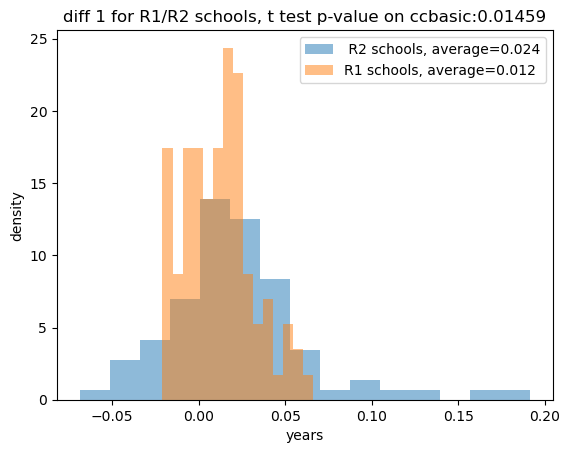

matched t test p-value on control:0.1329


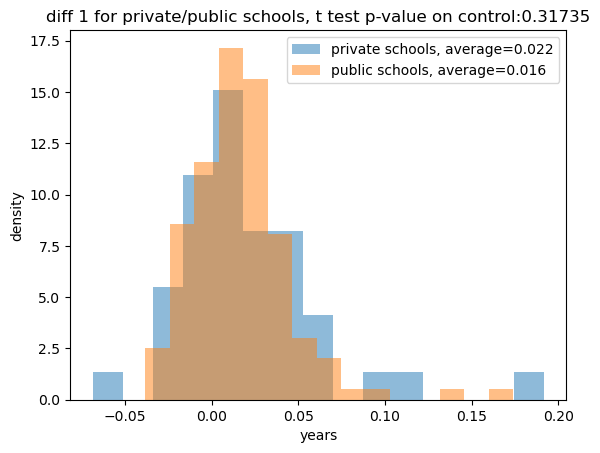

matched t test p-value on control:0.94417


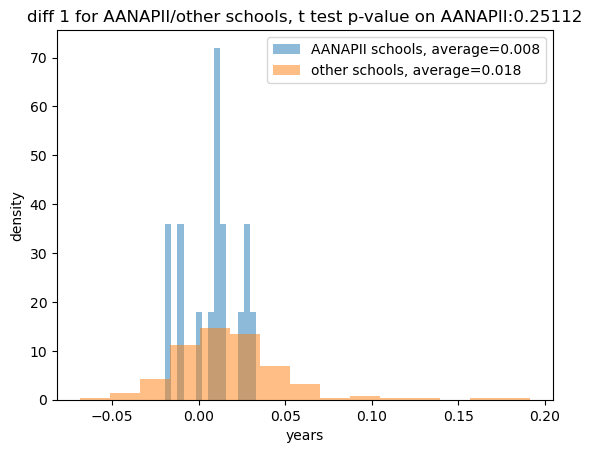

matched t test p-value on control:0.47345


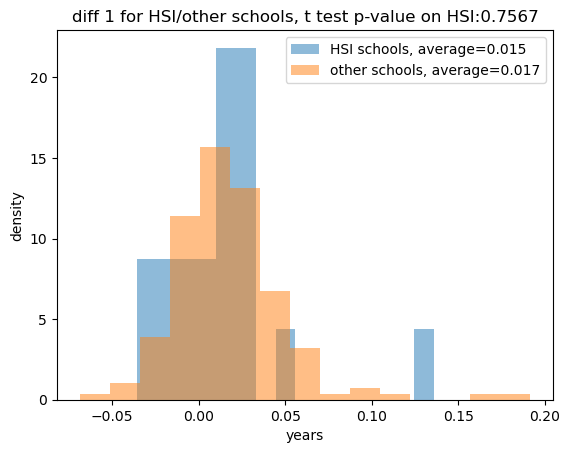

matched t test p-value on women president 2012-2019:0.55758


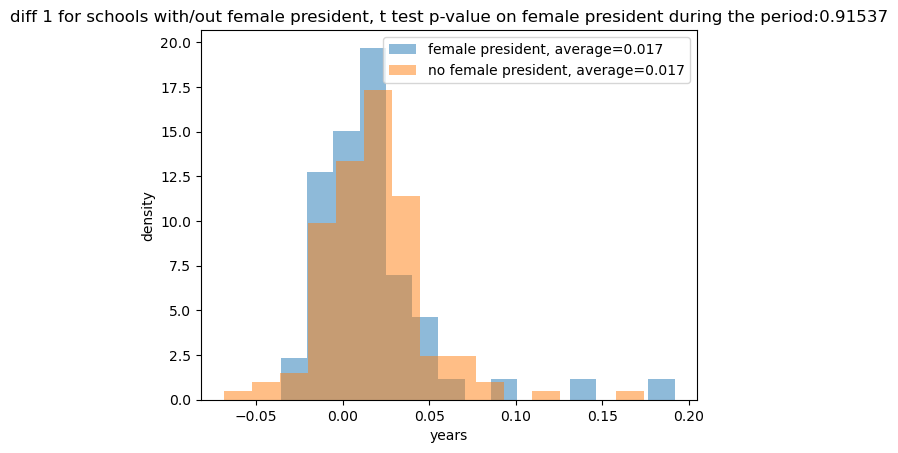

matched t test p-value on women president before 2012:0.40669


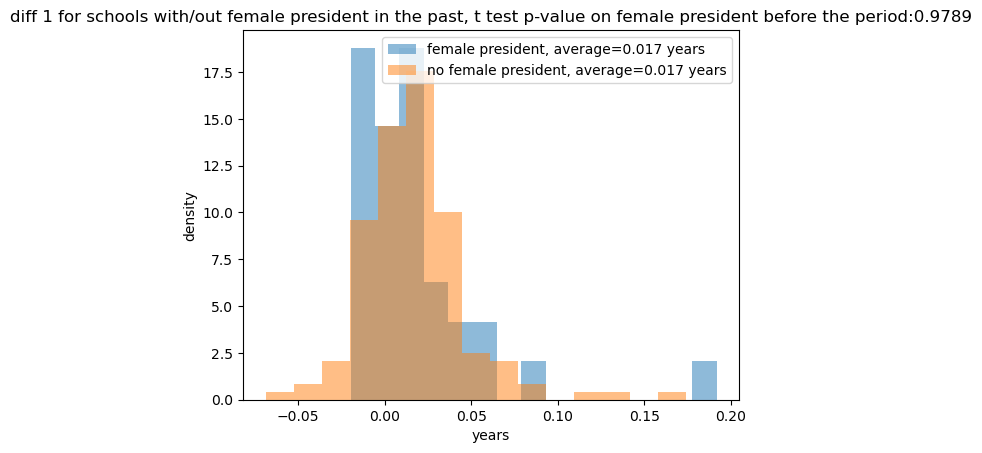

one way anova on REGION : F_onewayResult(statistic=2.168754924895757, pvalue=0.039174775945688946)
one way anova on LOCALE : F_onewayResult(statistic=0.8693146515340767, pvalue=0.5435902499321943)
one way anova on CCUGPROF : F_onewayResult(statistic=7.006239396532674, pvalue=1.3414880157028523e-08)
one way anova on CCSIZSET : F_onewayResult(statistic=9.893469895750952, pvalue=2.161527484366518e-09)
                            OLS Regression Results                            
Dep. Variable:                 diff 1   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.009
Method:                 Least Squares   F-statistic:                  0.007174
Date:                Mon, 02 Oct 2023   Prob (F-statistic):              0.933
Time:                        16:57:57   Log-Likelihood:                 258.71
No. Observations:                 108   AIC:                            -513.4
Df Residuals:                     106   BIC: 

                            OLS Regression Results                            
Dep. Variable:                 diff 1   R-squared:                       0.398
Model:                            OLS   Adj. R-squared:                  0.221
Method:                 Least Squares   F-statistic:                     2.254
Date:                Mon, 02 Oct 2023   Prob (F-statistic):           0.000332
Time:                        16:57:57   Log-Likelihood:                 405.83
No. Observations:                 173   AIC:                            -731.7
Df Residuals:                     133   BIC:                            -605.5
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-0.577376,0.565882
1,REGION,5,8,0.684844,0.496036
2,REGION,5,7,1.700805,0.095070
3,REGION,5,2,1.118281,0.267114
4,REGION,5,3,3.513460,0.000785
5,REGION,5,4,2.612236,0.011526
6,REGION,5,1,1.805295,0.076933
7,REGION,6,8,0.802687,0.427148
8,REGION,6,7,1.360656,0.184475
9,REGION,6,2,1.209379,0.232205


In [21]:
var_name = 'diff 1'
disp_result(var_name)

p-value for t test against 0:0.0047
matched t test p-value on ccbasic:0.68665
83
99


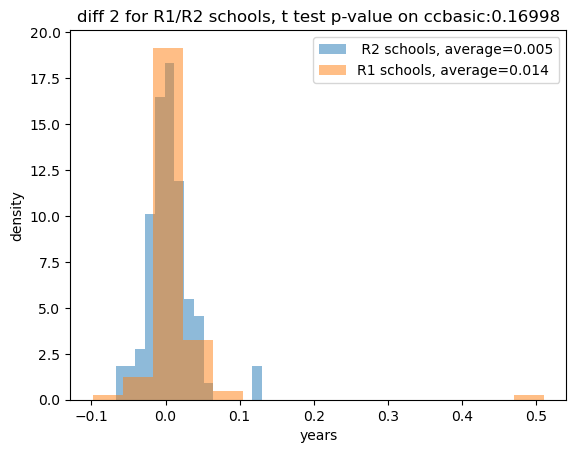

matched t test p-value on control:0.39022


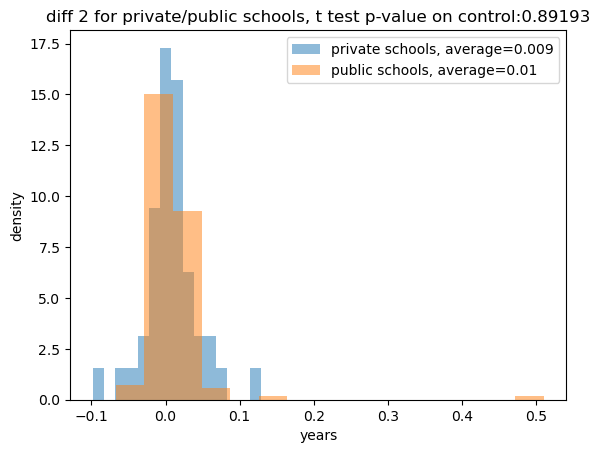

matched t test p-value on control:0.30072


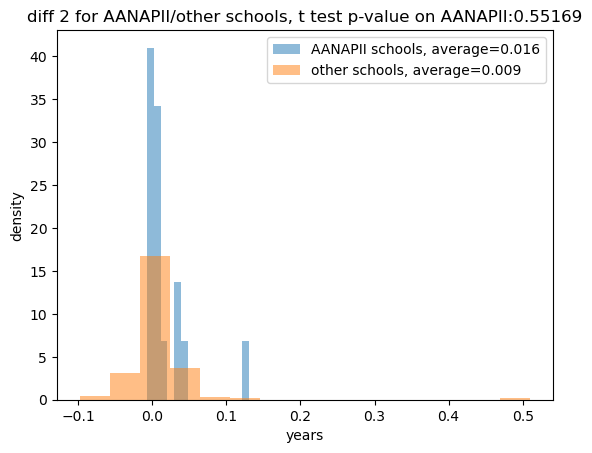

matched t test p-value on control:0.72213


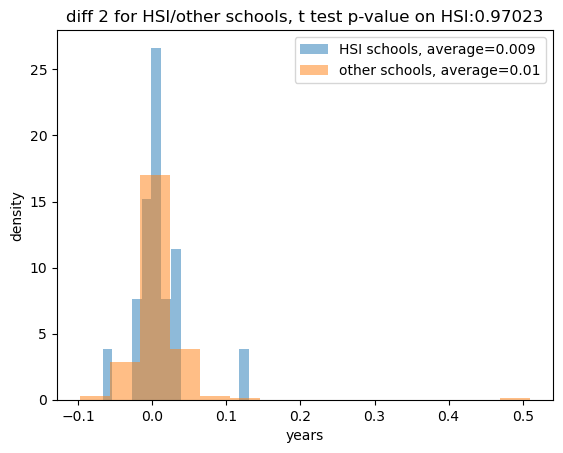

matched t test p-value on women president 2012-2019:0.62718


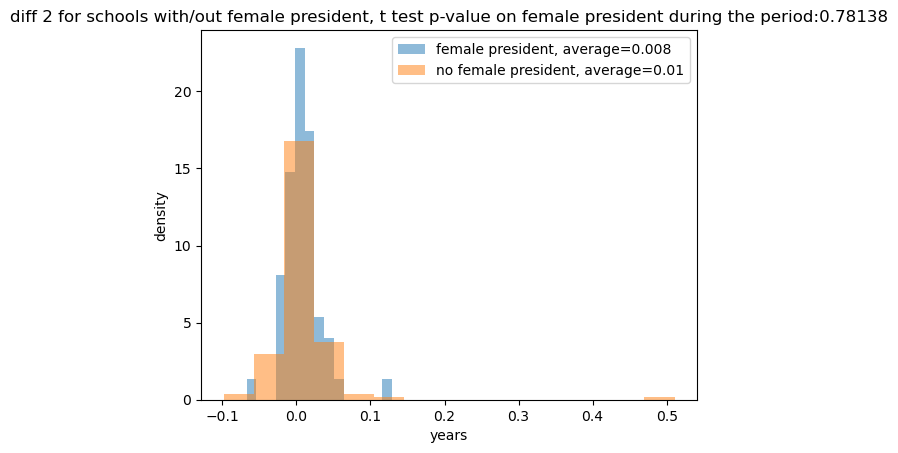

matched t test p-value on women president before 2012:0.36493


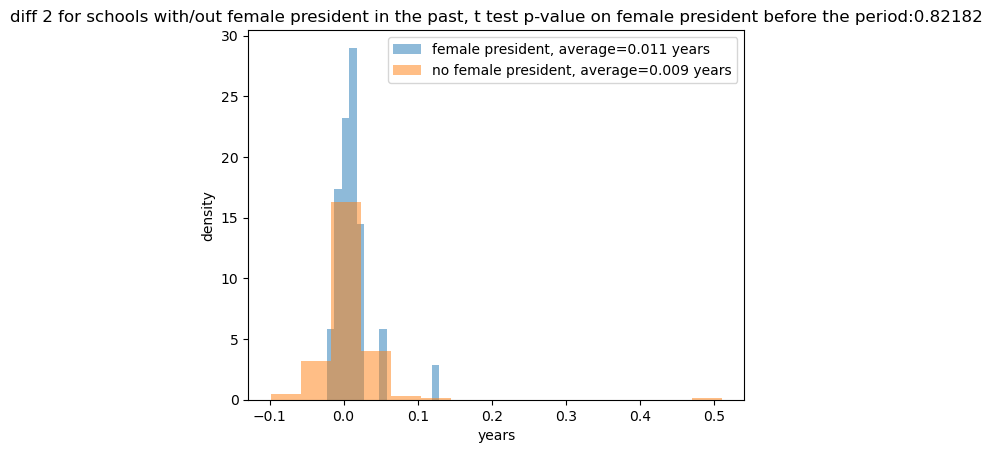

one way anova on REGION : F_onewayResult(statistic=0.8536741689711805, pvalue=0.5445193592376523)
one way anova on LOCALE : F_onewayResult(statistic=0.9369694233617533, pvalue=0.48748372291141495)
one way anova on CCUGPROF : F_onewayResult(statistic=10.219637898819009, pvalue=1.4983831696642451e-12)
one way anova on CCSIZSET : F_onewayResult(statistic=5.759125416753288, pvalue=1.71407865204517e-05)
                            OLS Regression Results                            
Dep. Variable:                 diff 2   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.009
Method:                 Least Squares   F-statistic:                  0.009538
Date:                Mon, 02 Oct 2023   Prob (F-statistic):              0.922
Time:                        16:57:58   Log-Likelihood:                 161.66
No. Observations:                 108   AIC:                            -319.3
Df Residuals:                     106   BIC: 

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,1.202082,0.234134
1,REGION,5,8,-1.799364,0.076908
2,REGION,5,7,1.574763,0.121495
3,REGION,5,2,-0.904307,0.368807
4,REGION,5,3,0.397936,0.691906
5,REGION,5,4,1.282842,0.204832
6,REGION,5,1,1.705921,0.094107
7,REGION,6,8,-1.947616,0.058877
8,REGION,6,7,0.374677,0.710724
9,REGION,6,2,-0.897030,0.374002


In [22]:
var_name = 'diff 2'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:4e-05
83
99


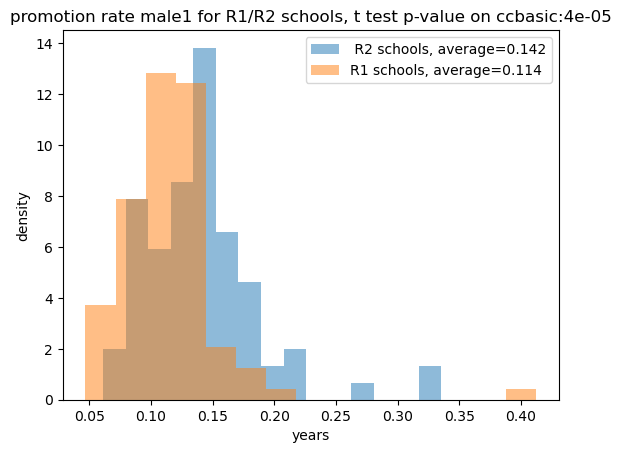

matched t test p-value on control:0.01983


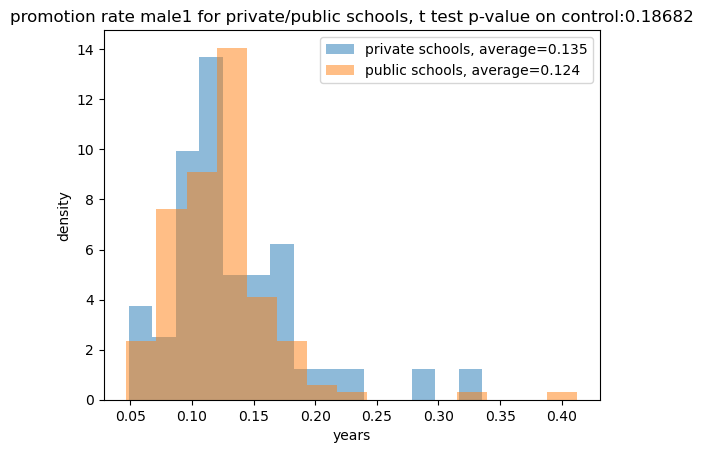

matched t test p-value on control:0.66982


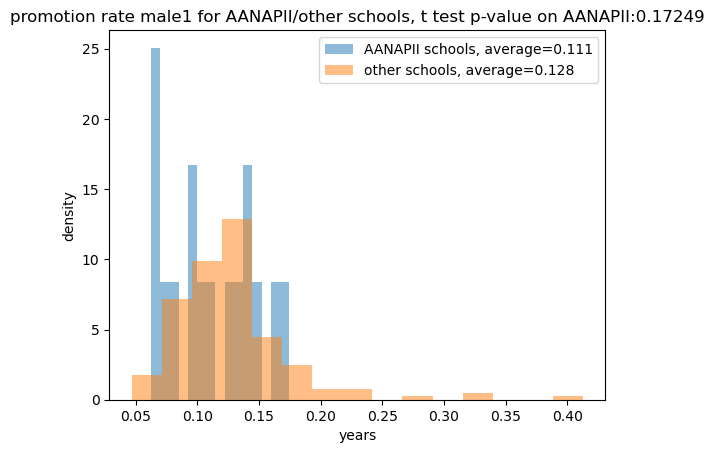

matched t test p-value on control:0.67288


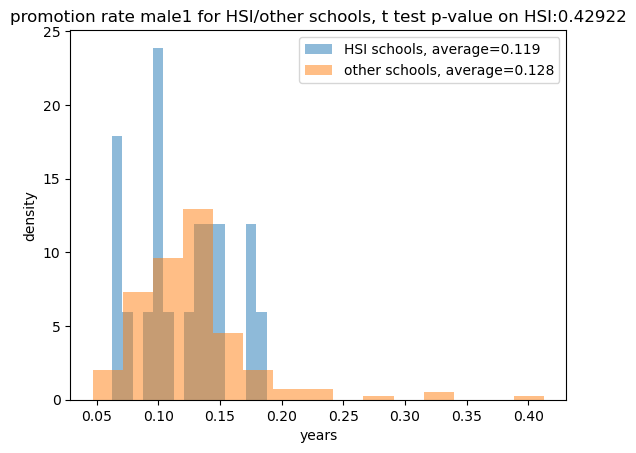

matched t test p-value on women president 2012-2019:0.0357


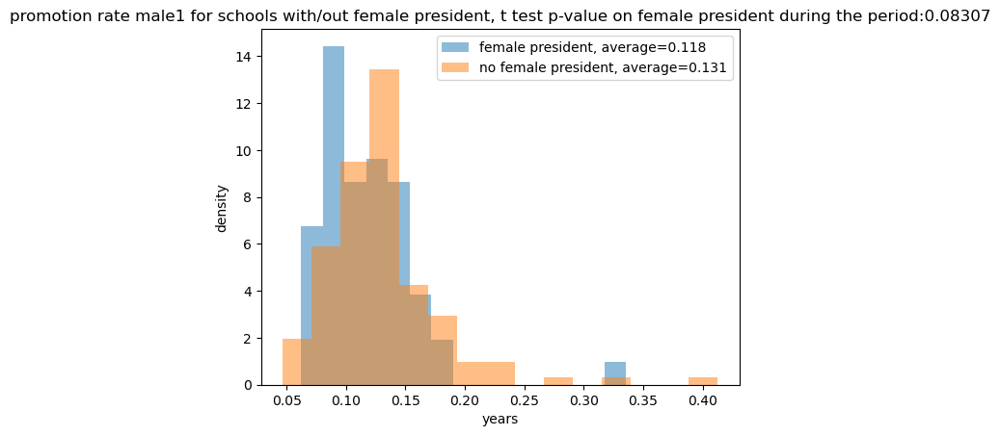

matched t test p-value on women president before 2012:0.40205


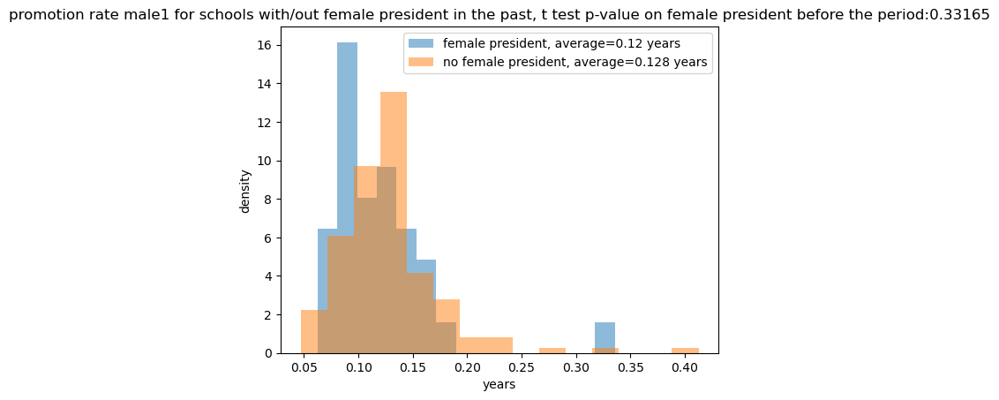

one way anova on REGION : F_onewayResult(statistic=2.275370843644365, pvalue=0.03057113348658697)
one way anova on LOCALE : F_onewayResult(statistic=0.949170341163126, pvalue=0.4776636252059744)
one way anova on CCUGPROF : F_onewayResult(statistic=9.374286942812668, pvalue=1.5280828357811383e-11)
one way anova on CCSIZSET : F_onewayResult(statistic=9.159275645571107, pvalue=1.0177947455319508e-08)
                             OLS Regression Results                             
Dep. Variable:     promotion rate male1   R-squared:                       0.062
Model:                              OLS   Adj. R-squared:                  0.053
Method:                   Least Squares   F-statistic:                     7.042
Date:                  Mon, 02 Oct 2023   Prob (F-statistic):            0.00919
Time:                          16:57:58   Log-Likelihood:                 192.12
No. Observations:                   108   AIC:                            -380.2
Df Residuals:                   

                             OLS Regression Results                             
Dep. Variable:     promotion rate male1   R-squared:                       0.498
Model:                              OLS   Adj. R-squared:                  0.351
Method:                   Least Squares   F-statistic:                     3.382
Date:                  Mon, 02 Oct 2023   Prob (F-statistic):           9.87e-08
Time:                          16:57:58   Log-Likelihood:                 373.64
No. Observations:                   173   AIC:                            -667.3
Df Residuals:                       133   BIC:                            -541.1
Df Model:                            39                                         
Covariance Type:              nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-0.434092,0.665805
1,REGION,5,8,1.139197,0.259075
2,REGION,5,7,1.850978,0.069968
3,REGION,5,2,-0.535260,0.594097
4,REGION,5,3,3.284533,0.001607
5,REGION,5,4,2.901422,0.005301
6,REGION,5,1,1.322698,0.191836
7,REGION,6,8,1.053732,0.298660
8,REGION,6,7,1.513068,0.141469
9,REGION,6,2,-0.072380,0.942588


In [23]:
var_name = 'promotion rate male1'
disp_result(var_name)
# cost is significant? # show in a map

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.18792
83
99


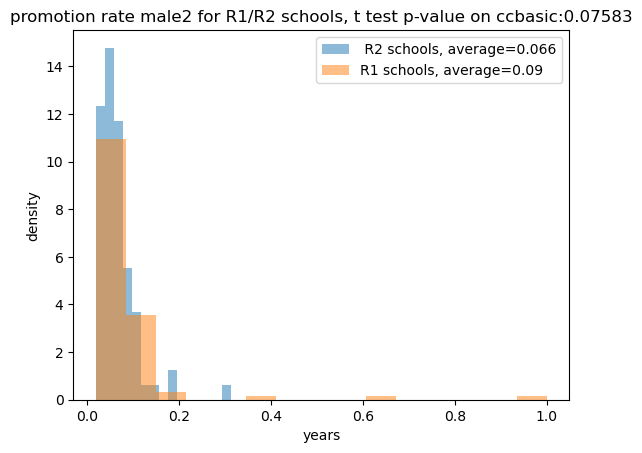

matched t test p-value on control:0.03774


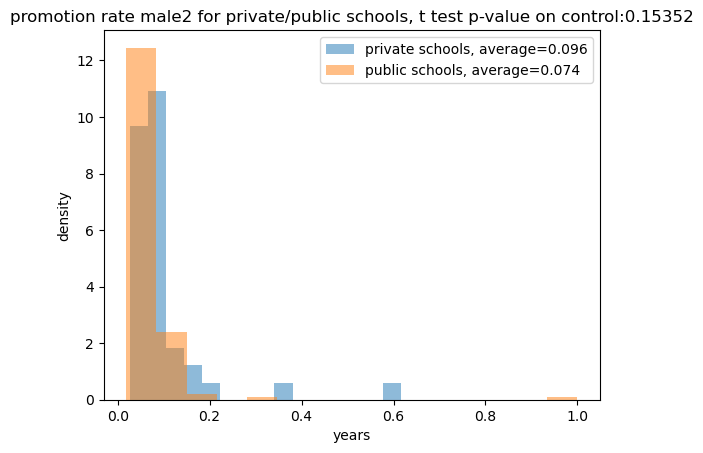

matched t test p-value on control:0.22389


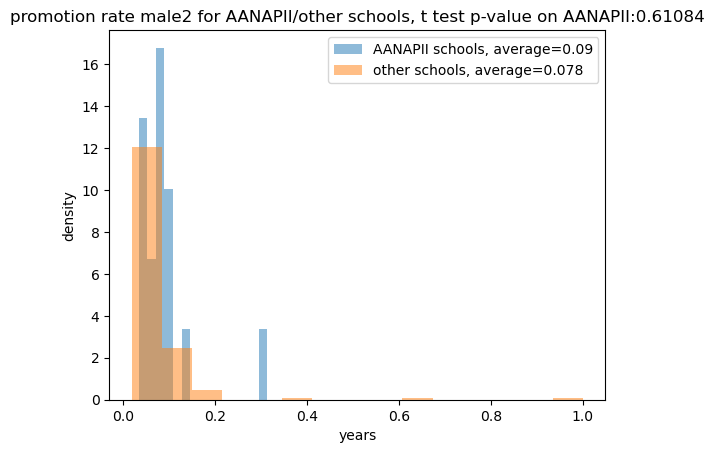

matched t test p-value on control:0.11469


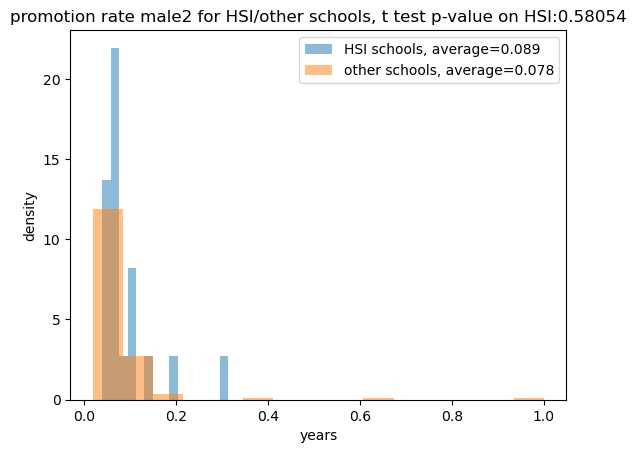

matched t test p-value on women president 2012-2019:0.7322


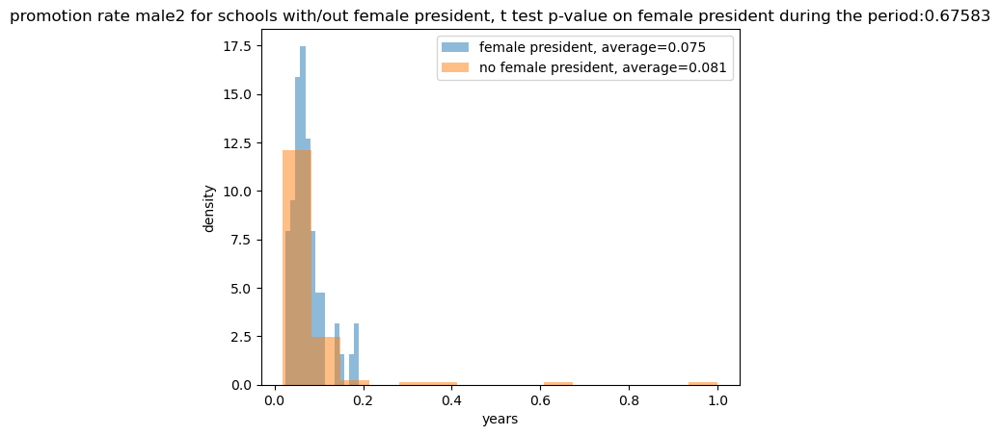

matched t test p-value on women president before 2012:0.51737


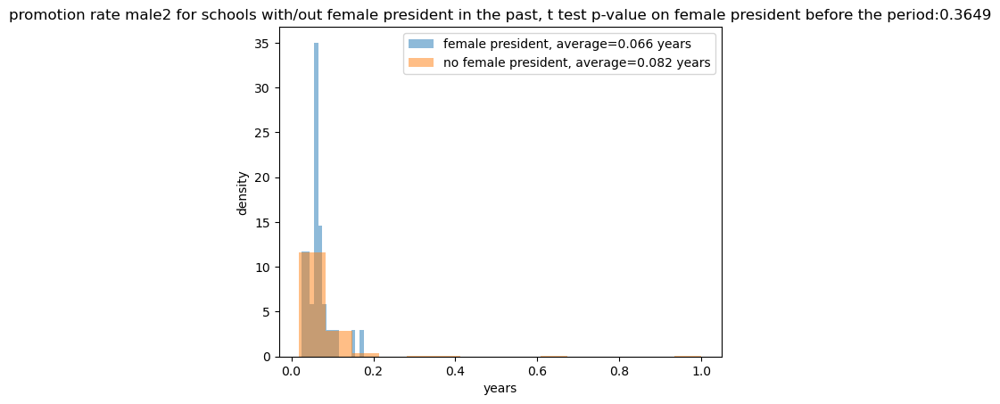

one way anova on REGION : F_onewayResult(statistic=1.950879681032921, pvalue=0.06438448994348854)
one way anova on LOCALE : F_onewayResult(statistic=0.9724162230788825, pvalue=0.45923649559794744)
one way anova on CCUGPROF : F_onewayResult(statistic=7.233832423818178, pvalue=6.876497367624099e-09)
one way anova on CCSIZSET : F_onewayResult(statistic=3.0736808839649896, pvalue=0.006939167599873141)
                             OLS Regression Results                             
Dep. Variable:     promotion rate male2   R-squared:                       0.024
Model:                              OLS   Adj. R-squared:                  0.015
Method:                   Least Squares   F-statistic:                     2.646
Date:                  Mon, 02 Oct 2023   Prob (F-statistic):              0.107
Time:                          16:57:59   Log-Likelihood:                 84.381
No. Observations:                   108   AIC:                            -164.8
Df Residuals:                   

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.390366,0.020043
1,REGION,5,8,-3.142257,0.002587
2,REGION,5,7,-0.831480,0.409579
3,REGION,5,2,-2.034165,0.045569
4,REGION,5,3,0.218521,0.827668
5,REGION,5,4,1.438503,0.155857
6,REGION,5,1,0.718521,0.475715
7,REGION,6,8,-0.409804,0.684251
8,REGION,6,7,0.945805,0.352339
9,REGION,6,2,-0.956295,0.343524


In [24]:
var_name = 'promotion rate male2'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:1e-05
83
99


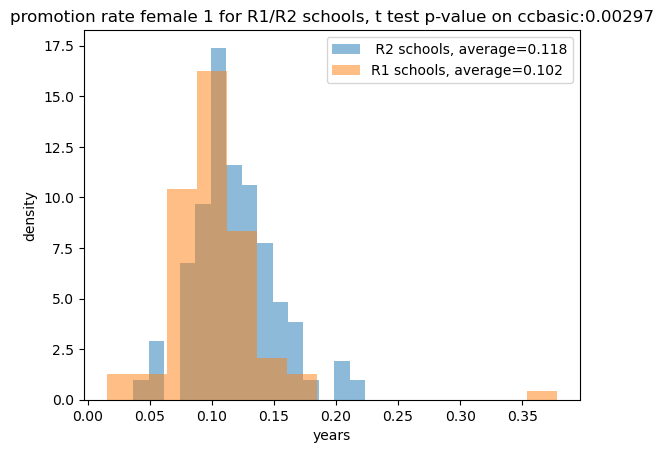

matched t test p-value on control:0.07942


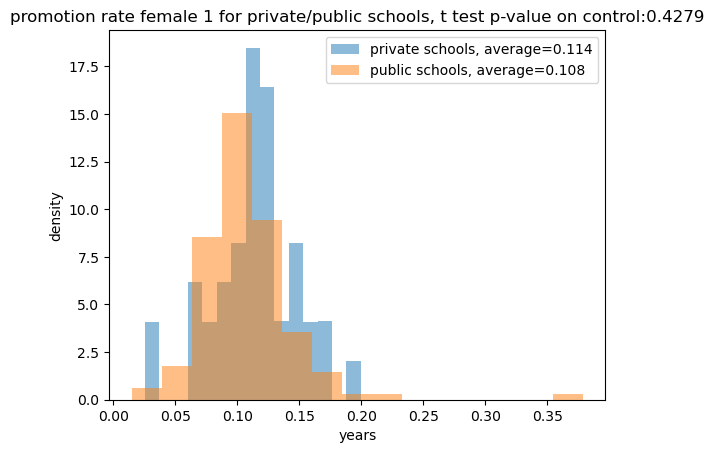

matched t test p-value on control:0.64938


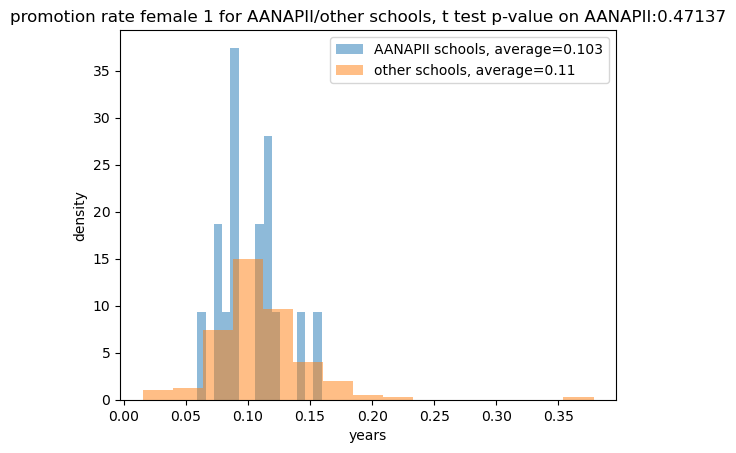

matched t test p-value on control:0.10537


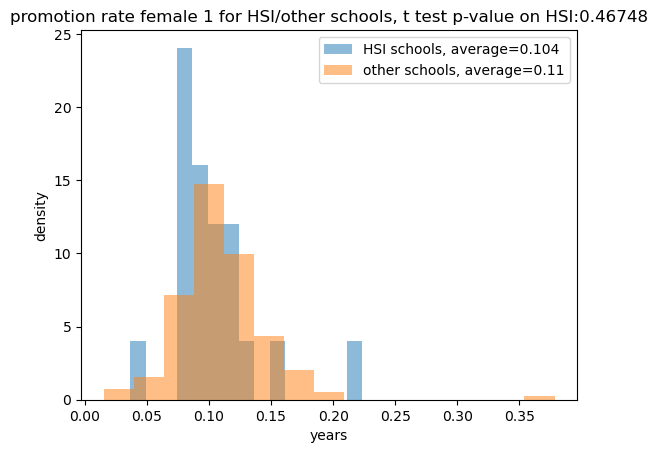

matched t test p-value on women president 2012-2019:0.01902


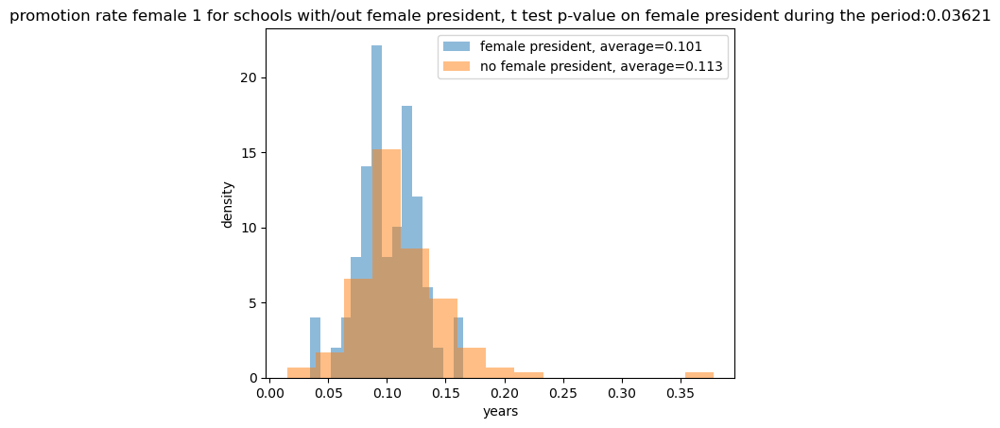

matched t test p-value on women president before 2012:0.81284


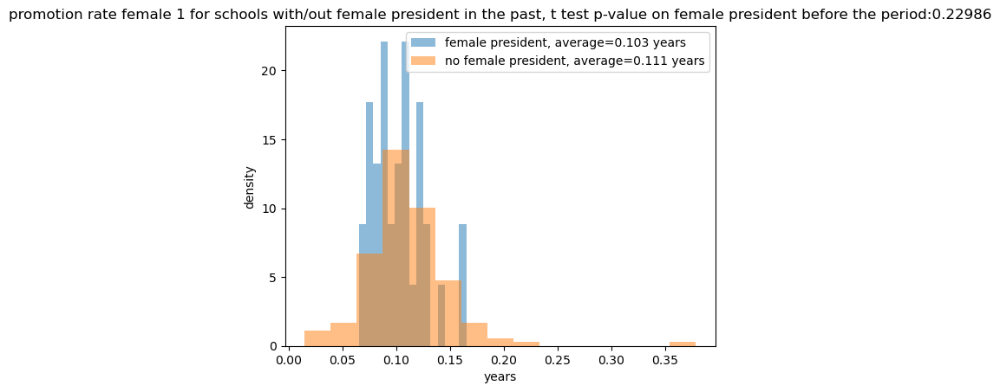

one way anova on REGION : F_onewayResult(statistic=1.0578004685244855, pvalue=0.3928993151424436)
one way anova on LOCALE : F_onewayResult(statistic=1.0991109768129896, pvalue=0.3660990551999981)
one way anova on CCUGPROF : F_onewayResult(statistic=5.185962221800543, pvalue=3.1326723297306553e-06)
one way anova on CCSIZSET : F_onewayResult(statistic=1.5836079923155237, pvalue=0.15444543495912247)
                               OLS Regression Results                              
Dep. Variable:     promotion rate female 1   R-squared:                       0.073
Model:                                 OLS   Adj. R-squared:                  0.065
Method:                      Least Squares   F-statistic:                     8.393
Date:                     Mon, 02 Oct 2023   Prob (F-statistic):            0.00458
Time:                             16:58:00   Log-Likelihood:                 203.47
No. Observations:                      108   AIC:                            -402.9
Df Residuals

                               OLS Regression Results                              
Dep. Variable:     promotion rate female 1   R-squared:                       0.352
Model:                                 OLS   Adj. R-squared:                  0.162
Method:                      Least Squares   F-statistic:                     1.850
Date:                     Mon, 02 Oct 2023   Prob (F-statistic):            0.00534
Time:                             16:58:00   Log-Likelihood:                 388.33
No. Observations:                      173   AIC:                            -696.7
Df Residuals:                          133   BIC:                            -570.5
Df Model:                               39                                         
Covariance Type:                 nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,0.084743,0.932753
1,REGION,5,8,0.928502,0.356807
2,REGION,5,7,0.772842,0.443183
3,REGION,5,2,-1.284881,0.202896
4,REGION,5,3,0.751392,0.454972
5,REGION,5,4,1.064800,0.291536
6,REGION,5,1,-0.074119,0.941206
7,REGION,6,8,0.759767,0.452082
8,REGION,6,7,0.631905,0.532575
9,REGION,6,2,-0.964590,0.339393


In [25]:
var_name = 'promotion rate female 1'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.2803
83
99


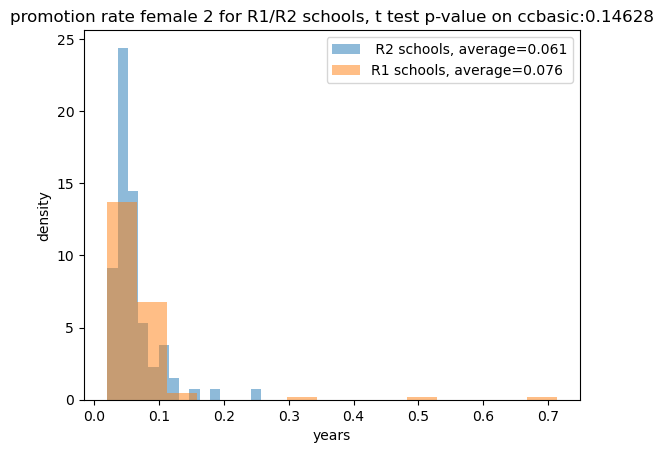

matched t test p-value on control:0.10592


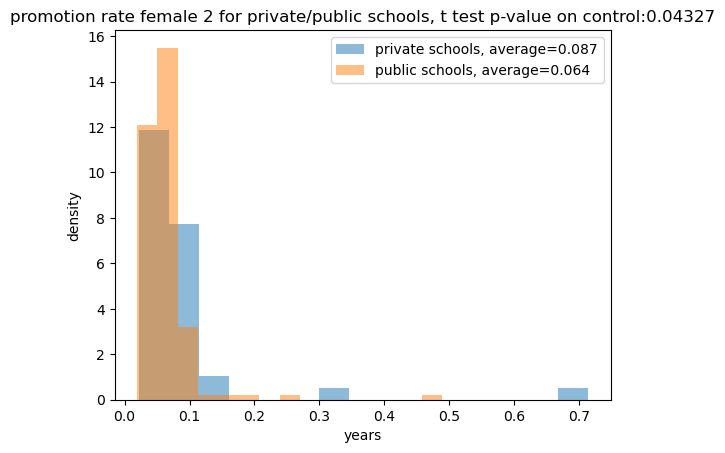

matched t test p-value on control:0.22974


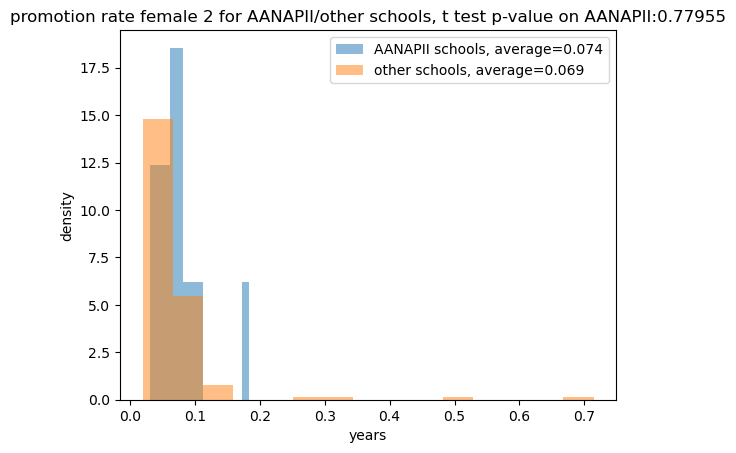

matched t test p-value on control:0.11633


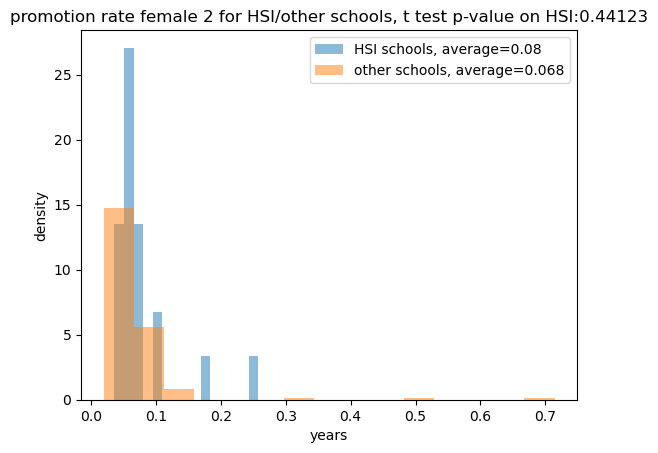

matched t test p-value on women president 2012-2019:0.39386


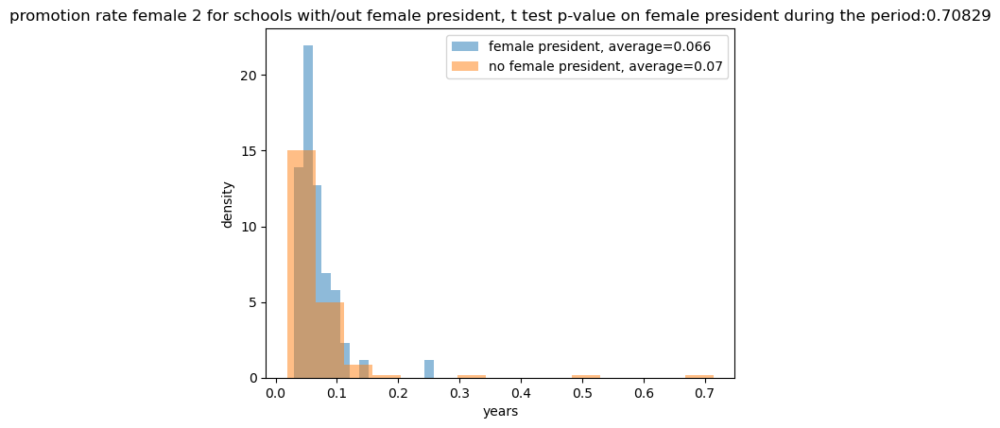

matched t test p-value on women president before 2012:0.92838


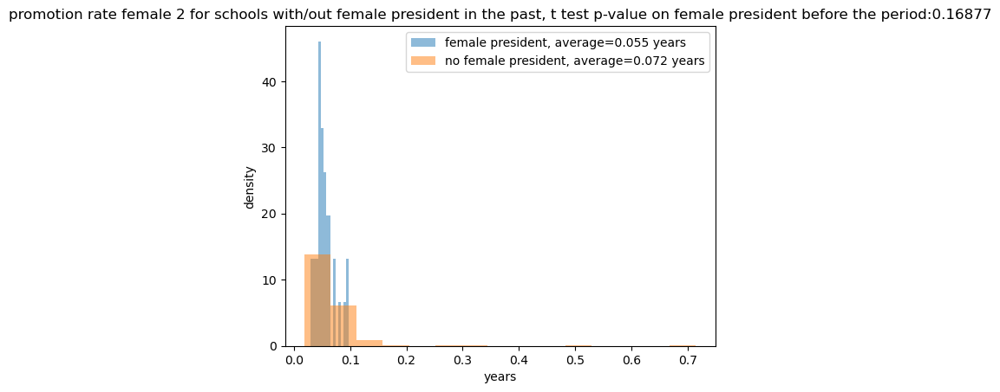

one way anova on REGION : F_onewayResult(statistic=2.0158330584282522, pvalue=0.05560548125859002)
one way anova on LOCALE : F_onewayResult(statistic=0.8017499423214668, pvalue=0.6018159139847262)
one way anova on CCUGPROF : F_onewayResult(statistic=2.5278318413654044, pvalue=0.00955302580809805)
one way anova on CCSIZSET : F_onewayResult(statistic=1.1043524062398729, pvalue=0.3616839287658351)
                               OLS Regression Results                              
Dep. Variable:     promotion rate female 2   R-squared:                       0.049
Model:                                 OLS   Adj. R-squared:                  0.040
Method:                      Least Squares   F-statistic:                     5.489
Date:                     Mon, 02 Oct 2023   Prob (F-statistic):             0.0210
Time:                             16:58:00   Log-Likelihood:                 120.66
No. Observations:                      108   AIC:                            -237.3
Df Residuals: 

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.992787,0.004032
1,REGION,5,8,-2.414133,0.018789
2,REGION,5,7,-2.269203,0.027516
3,REGION,5,2,-2.206079,0.030526
4,REGION,5,3,-0.066924,0.946836
5,REGION,5,4,0.582822,0.562353
6,REGION,5,1,-0.891624,0.376782
7,REGION,6,8,1.140781,0.261100
8,REGION,6,7,0.534858,0.596970
9,REGION,6,2,-0.704305,0.484511


In [26]:
var_name = 'promotion rate female 2'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:9e-05
83
99


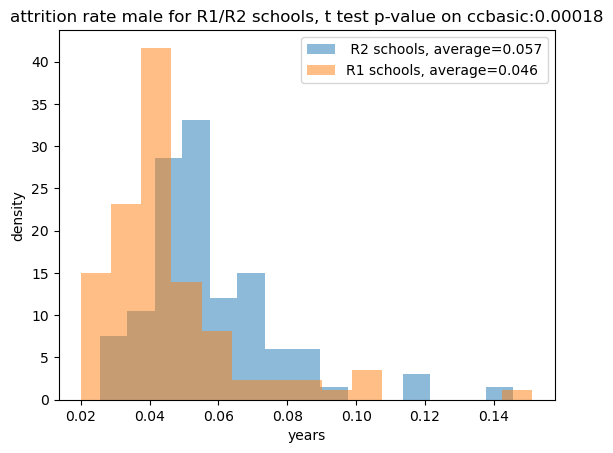

matched t test p-value on control:0.15174


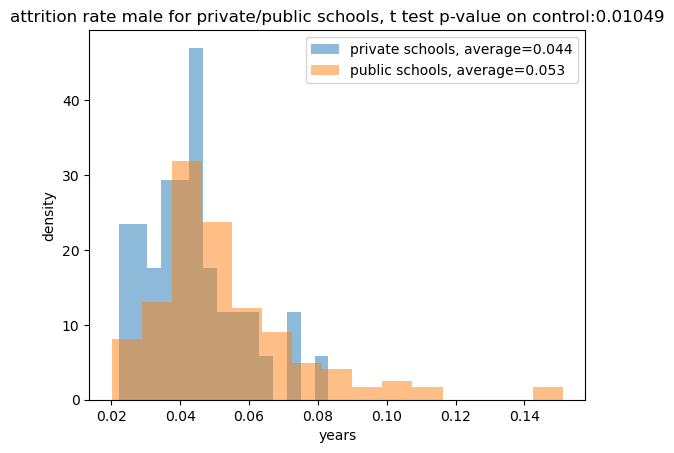

matched t test p-value on control:0.87719


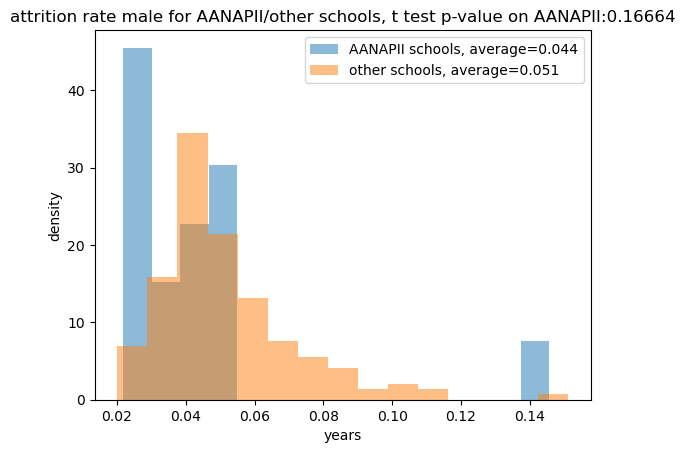

matched t test p-value on control:0.54247


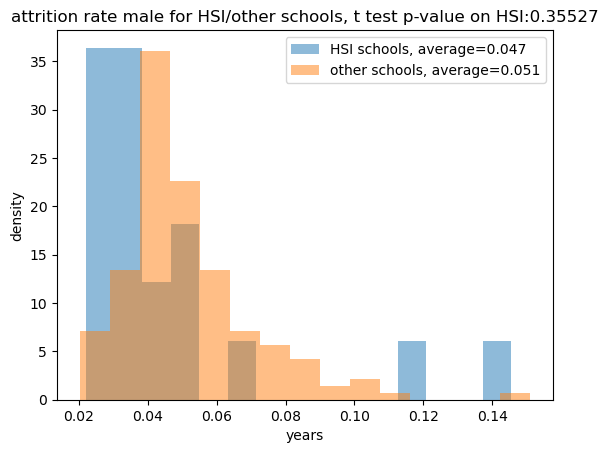

matched t test p-value on women president 2012-2019:0.11728


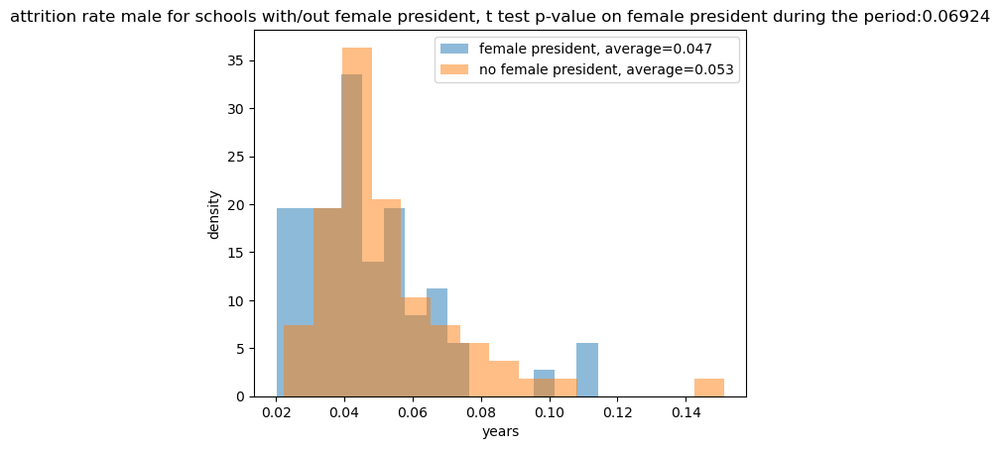

matched t test p-value on women president before 2012:0.32232


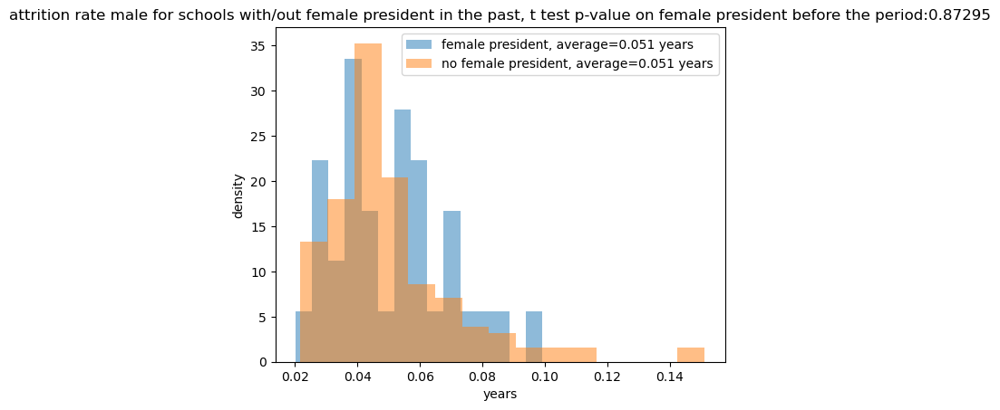

one way anova on REGION : F_onewayResult(statistic=1.4257484840178989, pvalue=0.19766391029746744)
one way anova on LOCALE : F_onewayResult(statistic=1.3993233733219559, pvalue=0.19980671114890344)
one way anova on CCUGPROF : F_onewayResult(statistic=7.841662300126237, pvalue=1.174040476458823e-09)
one way anova on CCSIZSET : F_onewayResult(statistic=3.0279319176328627, pvalue=0.007671051463188698)
                             OLS Regression Results                            
Dep. Variable:     attrition rate male   R-squared:                       0.092
Model:                             OLS   Adj. R-squared:                  0.084
Method:                  Least Squares   F-statistic:                     10.79
Date:                 Mon, 02 Oct 2023   Prob (F-statistic):            0.00138
Time:                         16:58:01   Log-Likelihood:                 269.37
No. Observations:                  108   AIC:                            -534.7
Df Residuals:                      106

                             OLS Regression Results                            
Dep. Variable:     attrition rate male   R-squared:                       0.474
Model:                             OLS   Adj. R-squared:                  0.320
Method:                  Least Squares   F-statistic:                     3.078
Date:                 Mon, 02 Oct 2023   Prob (F-statistic):           8.78e-07
Time:                         16:58:01   Log-Likelihood:                 494.42
No. Observations:                  173   AIC:                            -908.8
Df Residuals:                      133   BIC:                            -782.7
Df Model:                           39                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const   

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,1.011396,0.315957
1,REGION,5,8,2.498992,0.015163
2,REGION,5,7,1.303525,0.198250
3,REGION,5,2,0.720456,0.473545
4,REGION,5,3,1.611115,0.111720
5,REGION,5,4,-0.554920,0.581159
6,REGION,5,1,2.089693,0.041652
7,REGION,6,8,1.042098,0.303951
8,REGION,6,7,0.261579,0.795561
9,REGION,6,2,-0.231821,0.817623


In [27]:
var_name = 'attrition rate male'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:4e-05
83
99


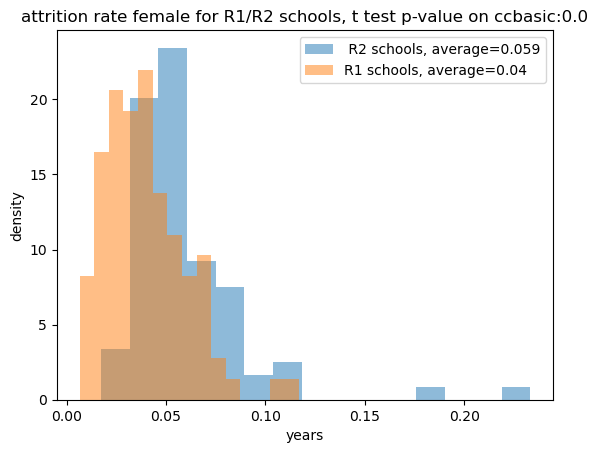

matched t test p-value on control:0.82441


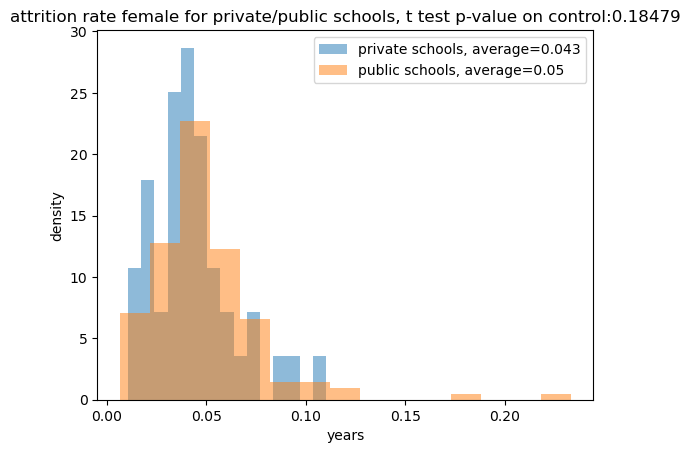

matched t test p-value on control:0.57253


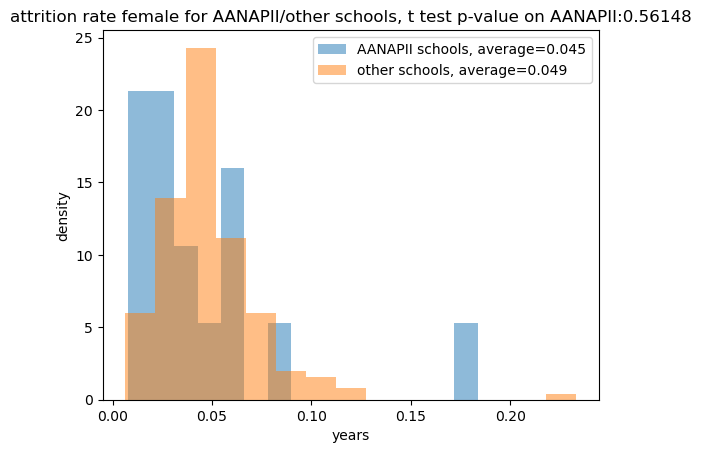

matched t test p-value on control:0.65434


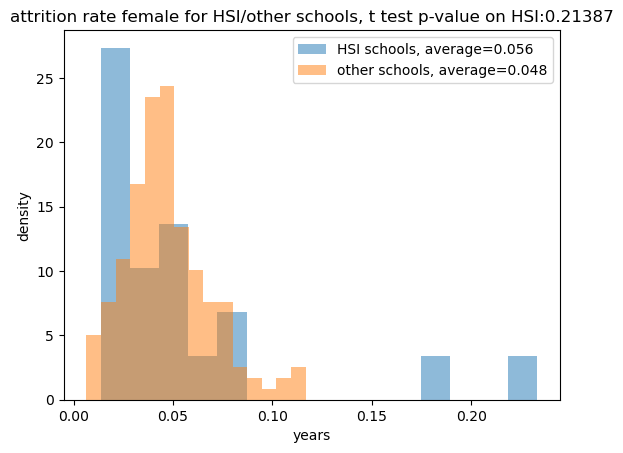

matched t test p-value on women president 2012-2019:0.20221


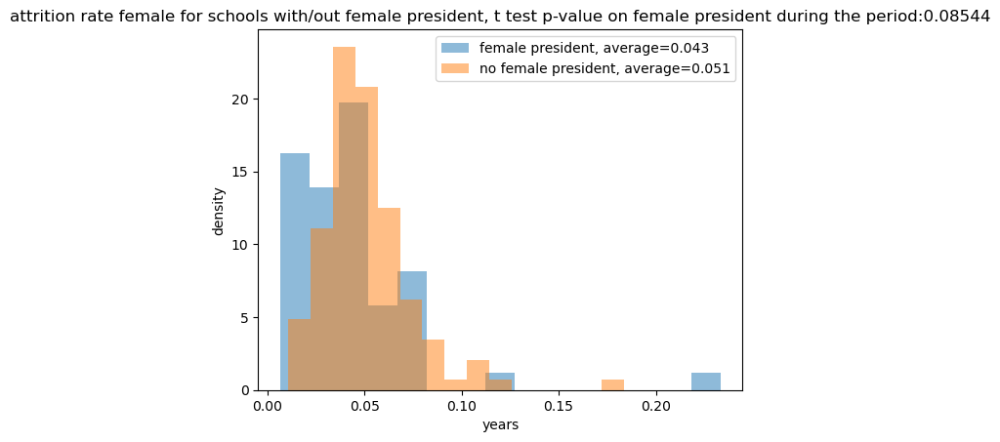

matched t test p-value on women president before 2012:0.9126


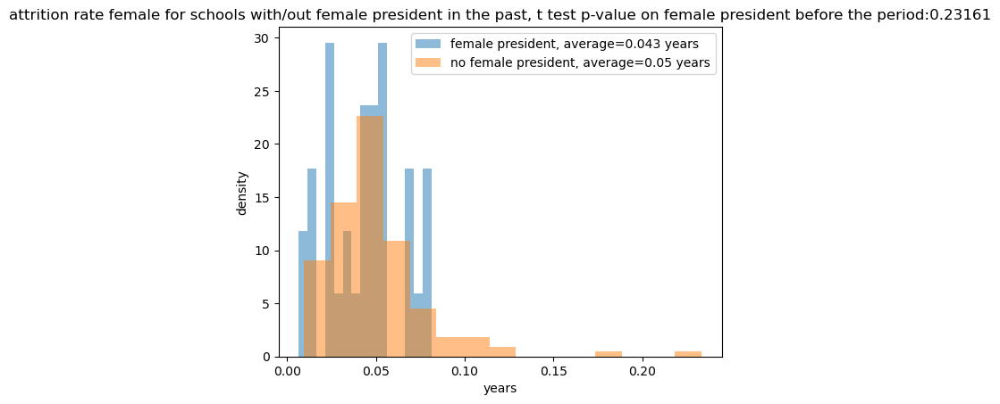

one way anova on REGION : F_onewayResult(statistic=1.4027491789423965, pvalue=0.20694108455999602)
one way anova on LOCALE : F_onewayResult(statistic=1.3992511672748595, pvalue=0.19983774150877018)
one way anova on CCUGPROF : F_onewayResult(statistic=4.041765569435079, pvalue=0.00010263853581681786)
one way anova on CCSIZSET : F_onewayResult(statistic=2.6629259511343752, pvalue=0.016948654211563403)
                              OLS Regression Results                             
Dep. Variable:     attrition rate female   R-squared:                       0.123
Model:                               OLS   Adj. R-squared:                  0.114
Method:                    Least Squares   F-statistic:                     14.83
Date:                   Mon, 02 Oct 2023   Prob (F-statistic):           0.000202
Time:                           16:58:02   Log-Likelihood:                 257.62
No. Observations:                    108   AIC:                            -511.2
Df Residuals:          

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-0.641994,0.523364
1,REGION,5,8,2.579086,0.012333
2,REGION,5,7,1.785956,0.080052
3,REGION,5,2,0.439500,0.661598
4,REGION,5,3,1.475751,0.144560
5,REGION,5,4,0.042288,0.966419
6,REGION,5,1,1.238349,0.221257
7,REGION,6,8,1.779262,0.083197
8,REGION,6,7,1.199942,0.240217
9,REGION,6,2,0.767632,0.446316


In [28]:
var_name = 'attrition rate female'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0
83
99


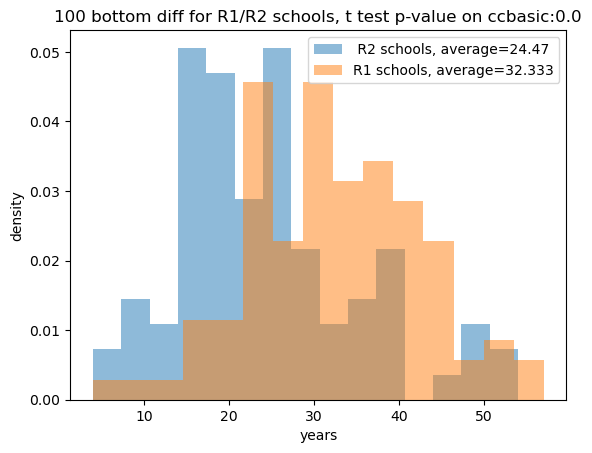

matched t test p-value on control:0.56888


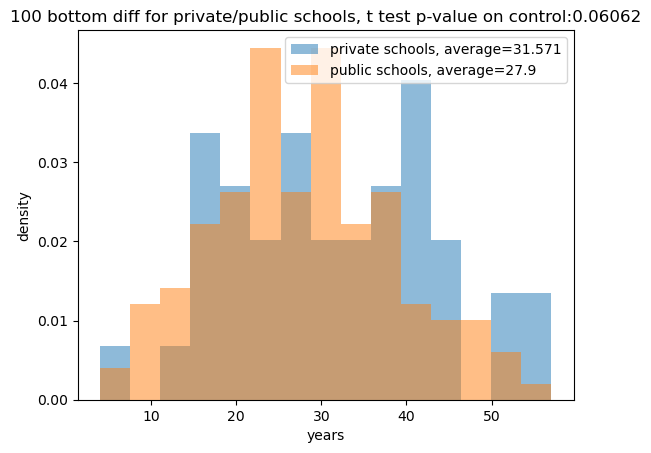

matched t test p-value on control:0.42519


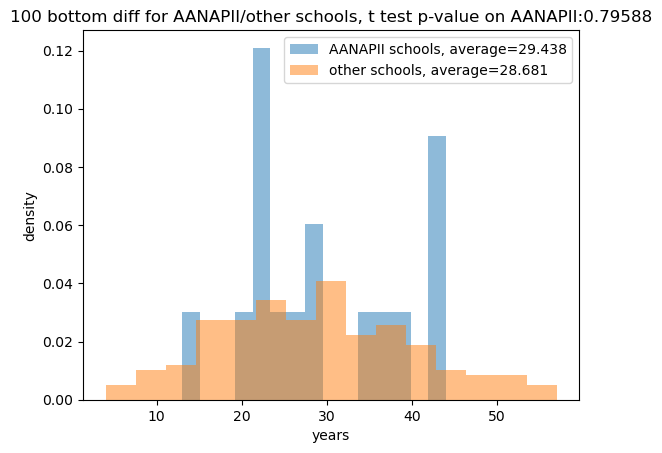

matched t test p-value on control:0.22986


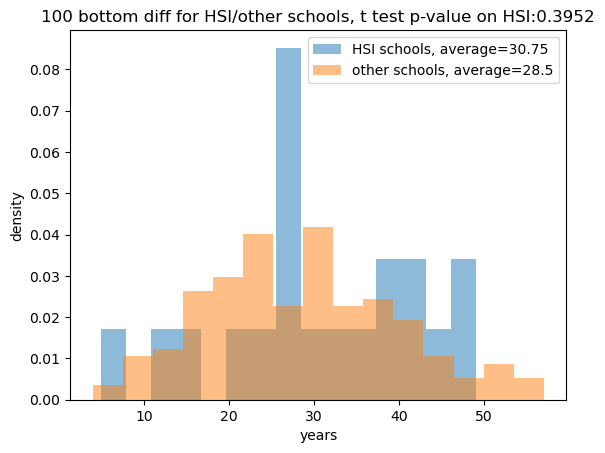

matched t test p-value on women president 2012-2019:0.31925


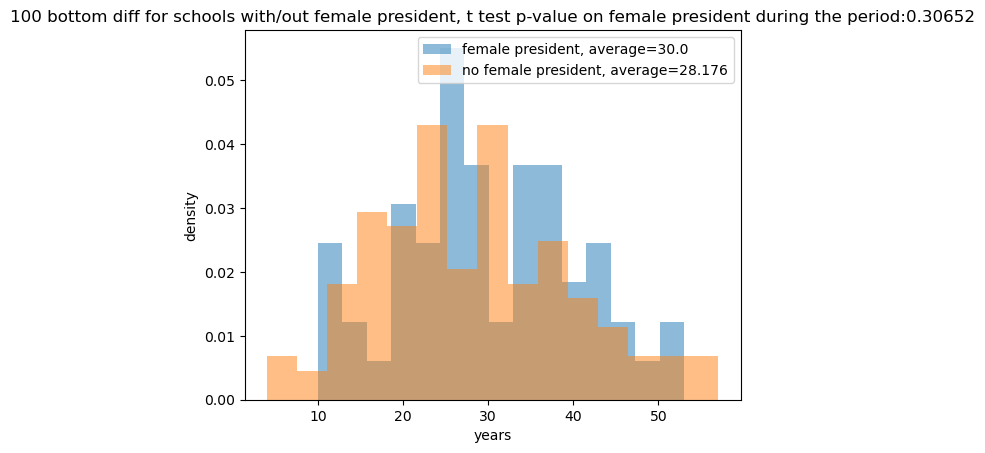

matched t test p-value on women president before 2012:0.0034


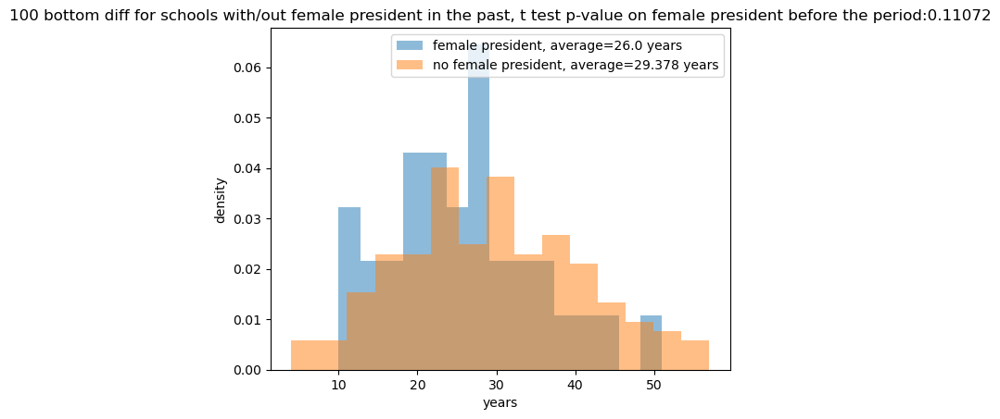

one way anova on REGION : F_onewayResult(statistic=0.495053416621774, pvalue=0.8373047834645602)
one way anova on LOCALE : F_onewayResult(statistic=1.2538758141663158, pvalue=0.2707953056259342)
one way anova on CCUGPROF : F_onewayResult(statistic=3.4530668907568267, pvalue=0.0006141163755724632)
one way anova on CCSIZSET : F_onewayResult(statistic=0.94085044577413, pvalue=0.46718565722820016)
                            OLS Regression Results                            
Dep. Variable:        100 bottom diff   R-squared:                       0.069
Model:                            OLS   Adj. R-squared:                  0.060
Method:                 Least Squares   F-statistic:                     7.840
Date:                Mon, 02 Oct 2023   Prob (F-statistic):            0.00607
Time:                        16:58:02   Log-Likelihood:                -405.58
No. Observations:                 108   AIC:                             815.2
Df Residuals:                     106   BIC:      

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.465976,0.147964
1,REGION,5,8,-1.175582,0.244330
2,REGION,5,7,0.368306,0.714170
3,REGION,5,2,-0.207683,0.836055
4,REGION,5,3,-0.300053,0.765039
5,REGION,5,4,-0.527207,0.600132
6,REGION,5,1,-0.209651,0.834775
7,REGION,6,8,0.273639,0.785844
8,REGION,6,7,1.334020,0.192947
9,REGION,6,2,1.044463,0.301295


In [29]:
var_name = '100 bottom diff'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.00654
83
99


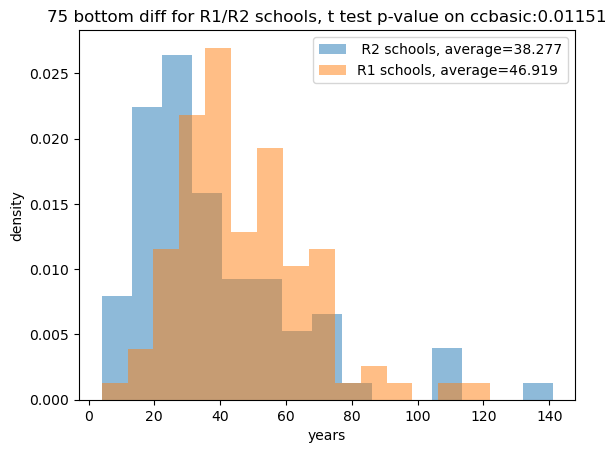

matched t test p-value on control:0.90052


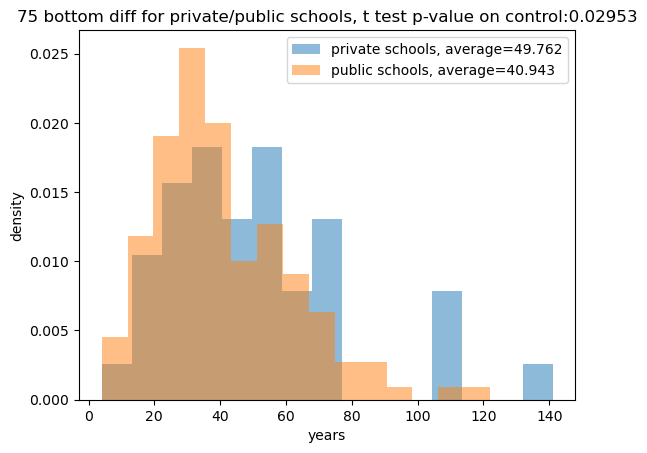

matched t test p-value on control:0.78291


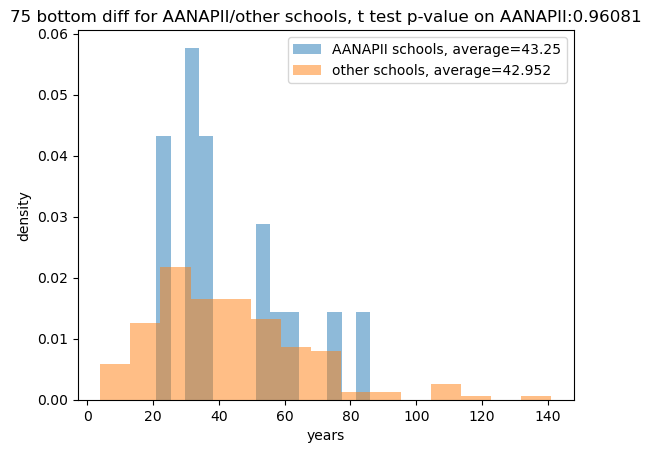

matched t test p-value on control:0.12246


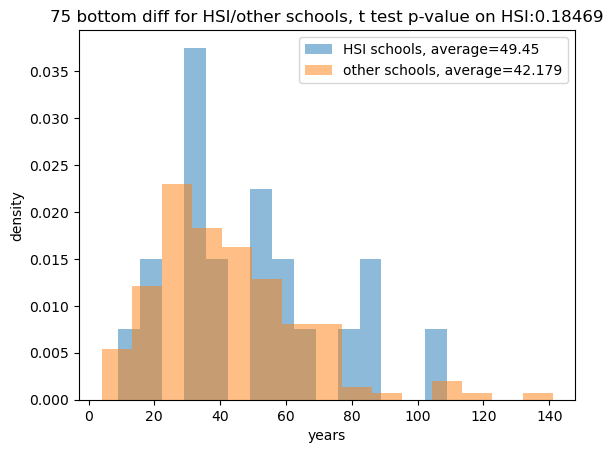

matched t test p-value on women president 2012-2019:0.45932


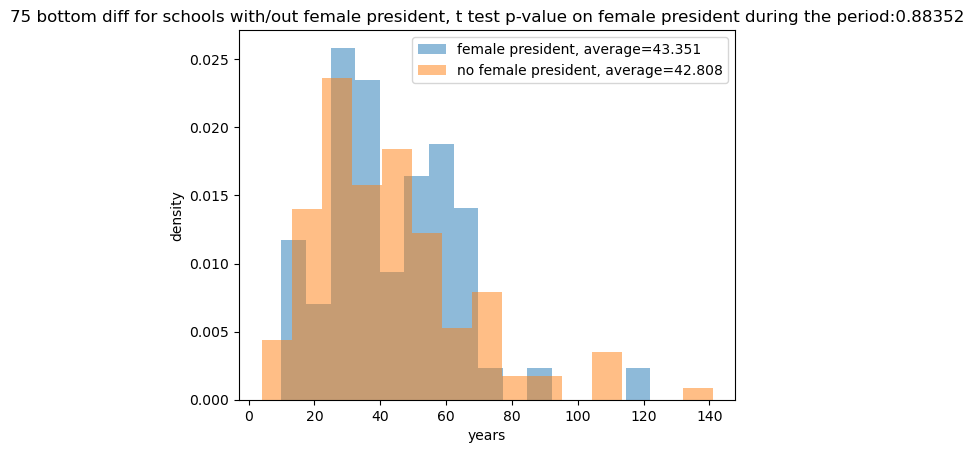

matched t test p-value on women president before 2012:0.00346


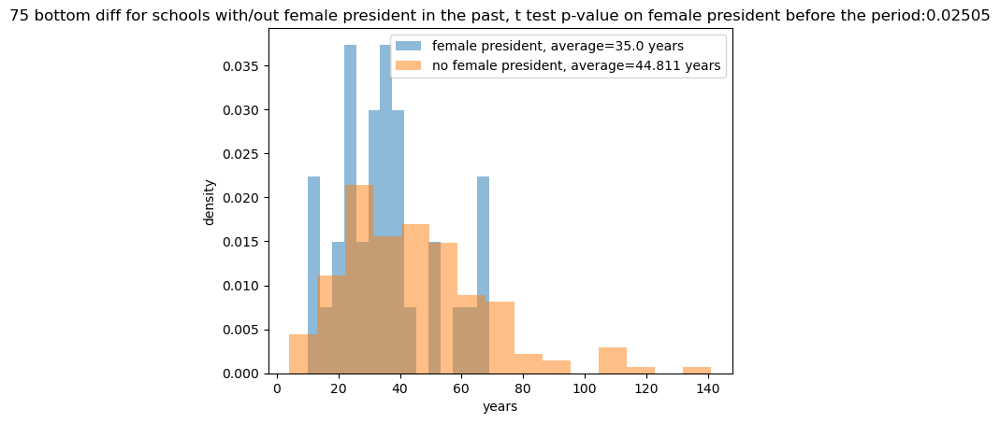

one way anova on REGION : F_onewayResult(statistic=0.8087411939685818, pvalue=0.5810942155536192)
one way anova on LOCALE : F_onewayResult(statistic=0.9485264303373737, pvalue=0.47817939071062976)
one way anova on CCUGPROF : F_onewayResult(statistic=1.9058703485521684, pvalue=0.053989946168734246)
one way anova on CCSIZSET : F_onewayResult(statistic=1.4583108750539435, pvalue=0.19517189664522783)
                            OLS Regression Results                            
Dep. Variable:         75 bottom diff   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     1.613
Date:                Mon, 02 Oct 2023   Prob (F-statistic):              0.207
Time:                        16:58:03   Log-Likelihood:                -485.52
No. Observations:                 108   AIC:                             975.0
Df Residuals:                     106   BIC:   

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.044442,0.045380
1,REGION,5,8,-1.042580,0.301257
2,REGION,5,7,0.567961,0.572553
3,REGION,5,2,-0.731913,0.466565
4,REGION,5,3,-0.207401,0.836308
5,REGION,5,4,-0.382345,0.703653
6,REGION,5,1,-0.404958,0.687202
7,REGION,6,8,0.817071,0.418981
8,REGION,6,7,1.569619,0.127737
9,REGION,6,2,1.146235,0.257154


In [30]:
var_name = '75 bottom diff'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0
83
99


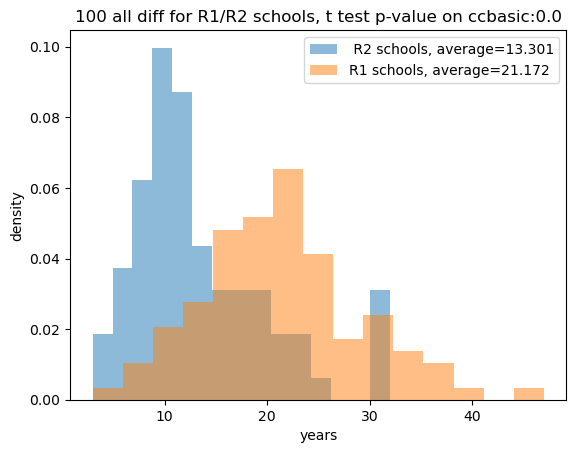

matched t test p-value on control:0.85797


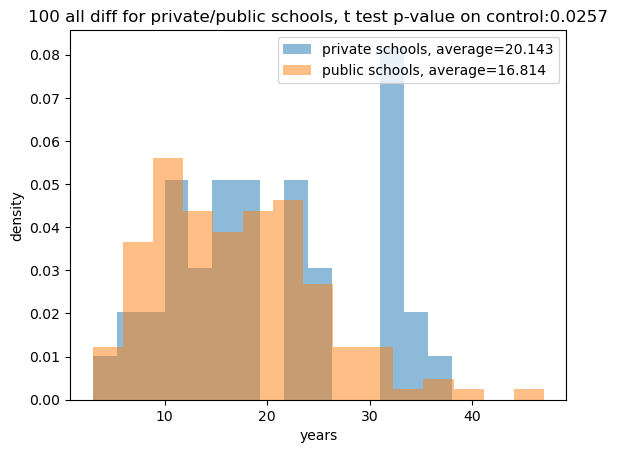

matched t test p-value on control:0.4487


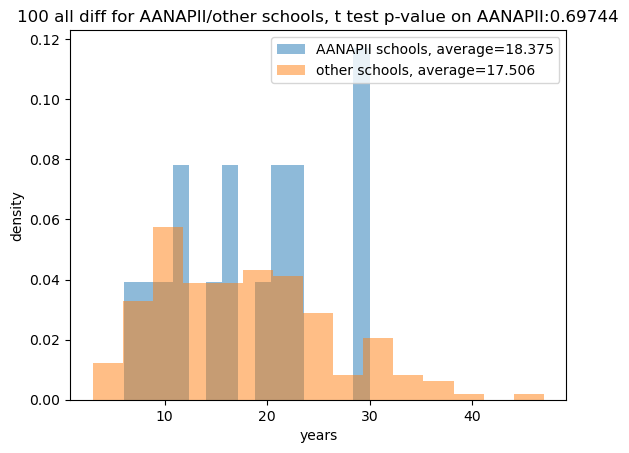

matched t test p-value on control:0.25516


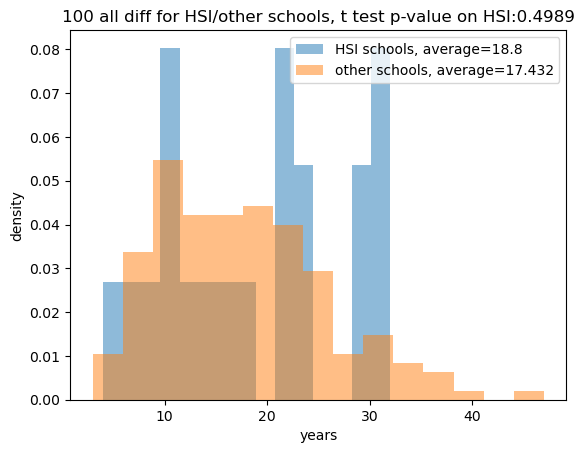

matched t test p-value on women president 2012-2019:0.1092


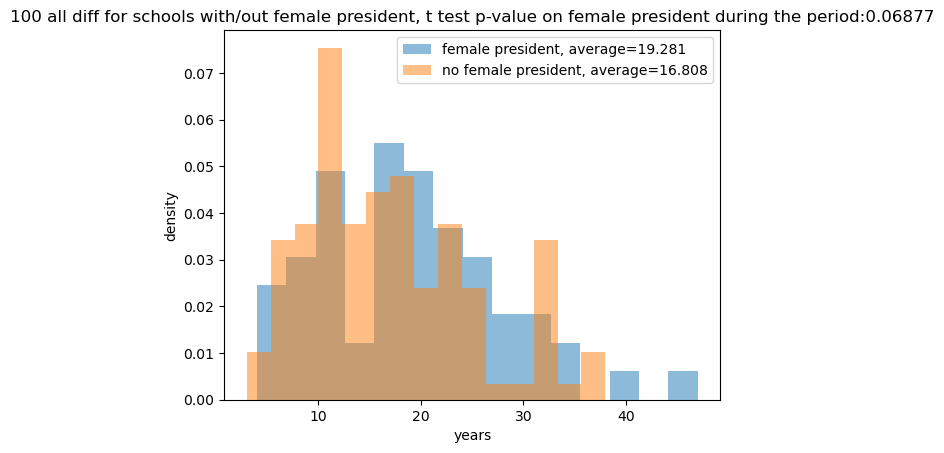

matched t test p-value on women president before 2012:0.04162


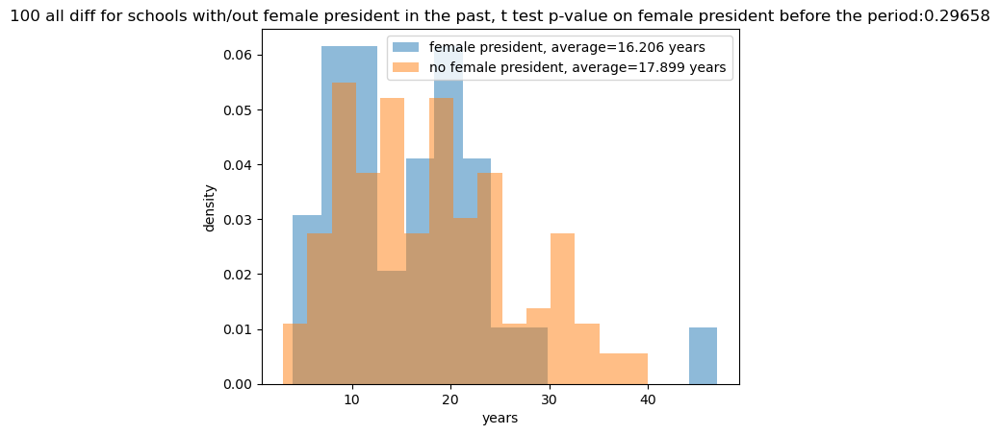

one way anova on REGION : F_onewayResult(statistic=0.7477320556761983, pvalue=0.6318520962796292)
one way anova on LOCALE : F_onewayResult(statistic=1.137758268801985, pvalue=0.34034729657914126)
one way anova on CCUGPROF : F_onewayResult(statistic=5.529360779509307, pvalue=1.1057387352962829e-06)
one way anova on CCSIZSET : F_onewayResult(statistic=1.4888506888976176, pvalue=0.1844682366271767)
                            OLS Regression Results                            
Dep. Variable:           100 all diff   R-squared:                       0.155
Model:                            OLS   Adj. R-squared:                  0.147
Method:                 Least Squares   F-statistic:                     19.48
Date:                Mon, 02 Oct 2023   Prob (F-statistic):           2.45e-05
Time:                        16:58:04   Log-Likelihood:                -374.35
No. Observations:                 108   AIC:                             752.7
Df Residuals:                     106   BIC:    

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.571423,0.121432
1,REGION,5,8,-1.808148,0.075513
2,REGION,5,7,-0.057443,0.954416
3,REGION,5,2,-0.426170,0.671238
4,REGION,5,3,-0.450106,0.654045
5,REGION,5,4,-0.290898,0.772204
6,REGION,5,1,0.054912,0.956423
7,REGION,6,8,-0.133249,0.894699
8,REGION,6,7,0.993444,0.329002
9,REGION,6,2,1.016655,0.314212


In [31]:
var_name = '100 all diff'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.00016
83
99


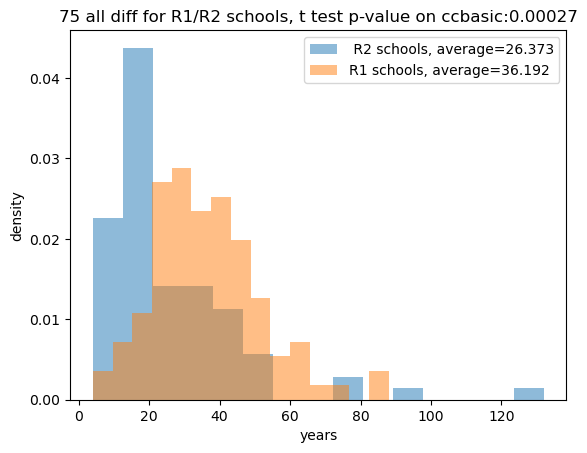

matched t test p-value on control:0.6808


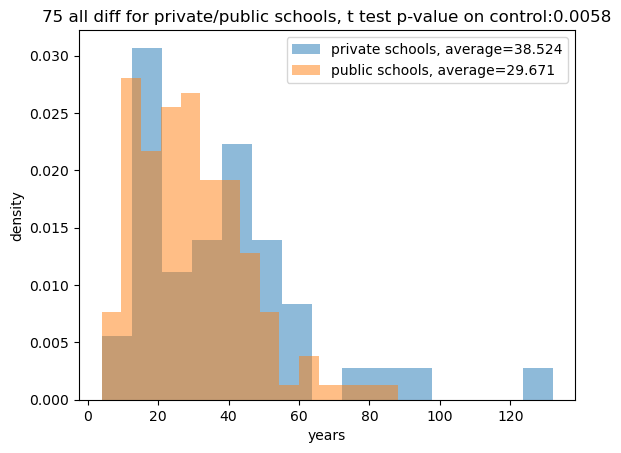

matched t test p-value on control:0.41315


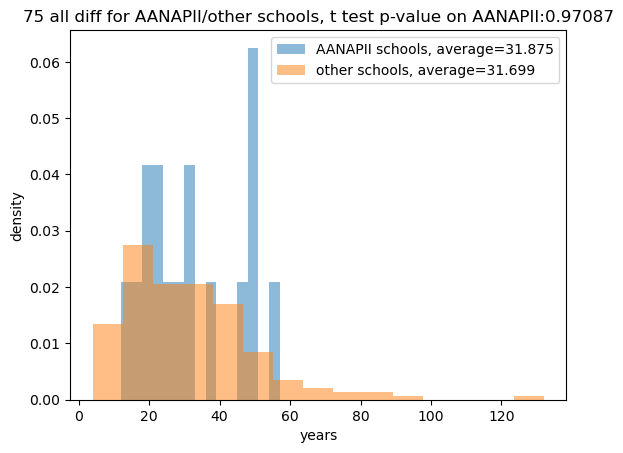

matched t test p-value on control:0.10082


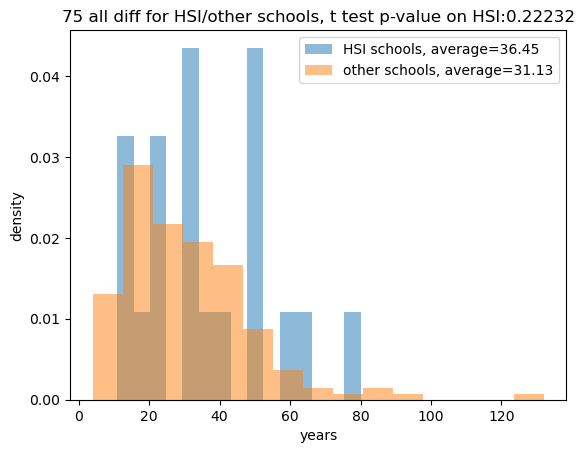

matched t test p-value on women president 2012-2019:0.17147


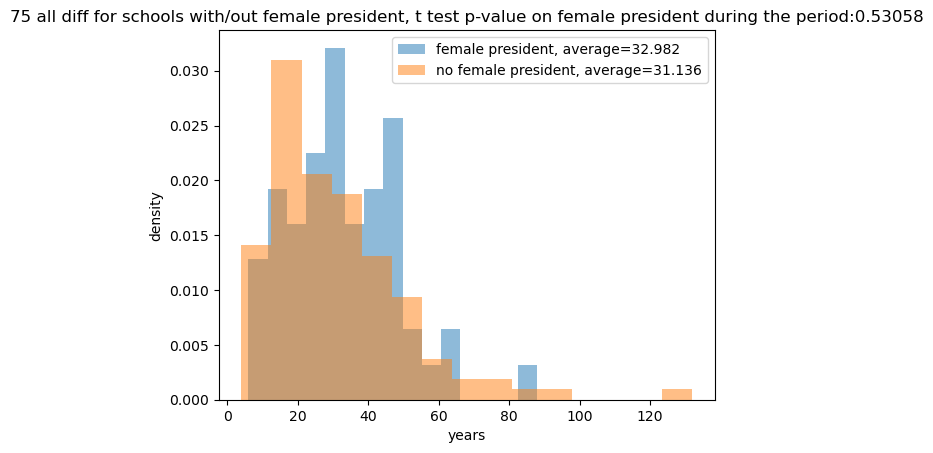

matched t test p-value on women president before 2012:0.00762


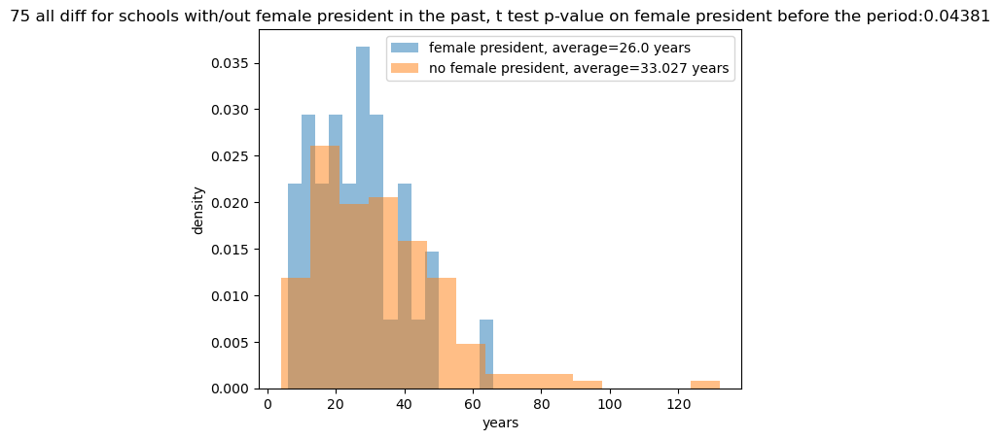

one way anova on REGION : F_onewayResult(statistic=1.176852575987402, pvalue=0.31838849968952554)
one way anova on LOCALE : F_onewayResult(statistic=0.84721222444634, pvalue=0.5624415811530767)
one way anova on CCUGPROF : F_onewayResult(statistic=3.0279506225756507, pvalue=0.002200669987349585)
one way anova on CCSIZSET : F_onewayResult(statistic=2.1349686156675003, pvalue=0.05165107022888638)
                            OLS Regression Results                            
Dep. Variable:            75 all diff   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.028
Method:                 Least Squares   F-statistic:                     4.048
Date:                Mon, 02 Oct 2023   Prob (F-statistic):             0.0468
Time:                        16:58:04   Log-Likelihood:                -465.98
No. Observations:                 108   AIC:                             936.0
Df Residuals:                     106   BIC:      

                            OLS Regression Results                            
Dep. Variable:            75 all diff   R-squared:                       0.397
Model:                            OLS   Adj. R-squared:                  0.220
Method:                 Least Squares   F-statistic:                     2.245
Date:                Mon, 02 Oct 2023   Prob (F-statistic):           0.000355
Time:                        16:58:04   Log-Likelihood:                -704.70
No. Observations:                 173   AIC:                             1489.
Df Residuals:                     133   BIC:                             1616.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.414770,0.018864
1,REGION,5,8,-1.701065,0.094024
2,REGION,5,7,0.085918,0.931868
3,REGION,5,2,-0.982554,0.329072
4,REGION,5,3,-0.581856,0.562560
5,REGION,5,4,-0.335330,0.738629
6,REGION,5,1,-0.362671,0.718349
7,REGION,6,8,0.801121,0.428043
8,REGION,6,7,1.417478,0.167376
9,REGION,6,2,1.410462,0.164595


In [32]:
var_name = '75 all diff'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0
83
99


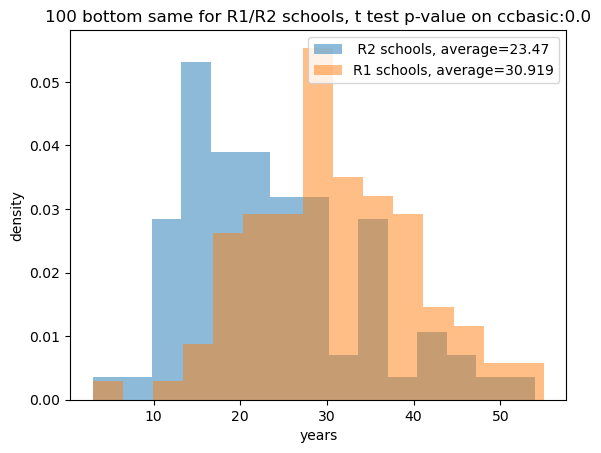

matched t test p-value on control:0.54488


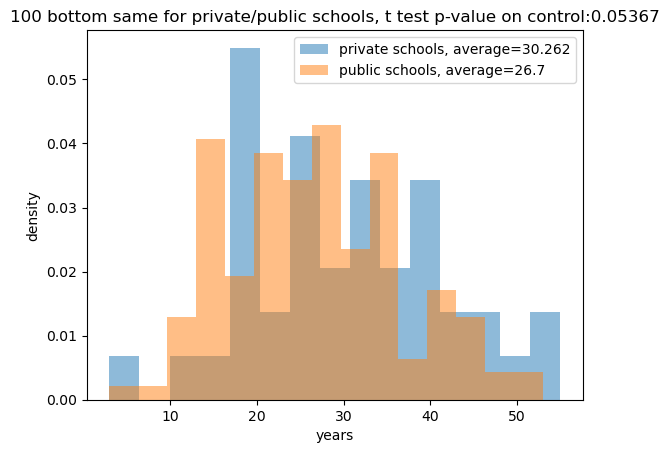

matched t test p-value on control:0.45519


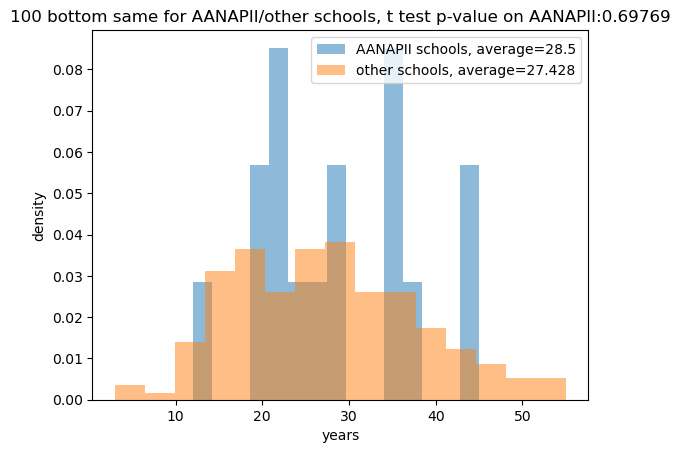

matched t test p-value on control:0.15519


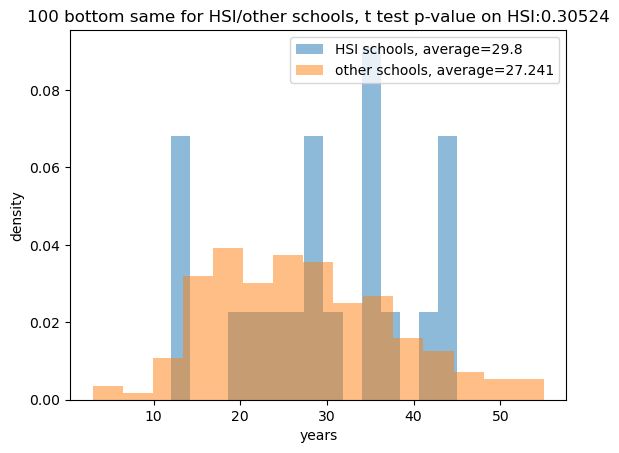

matched t test p-value on women president 2012-2019:0.19591


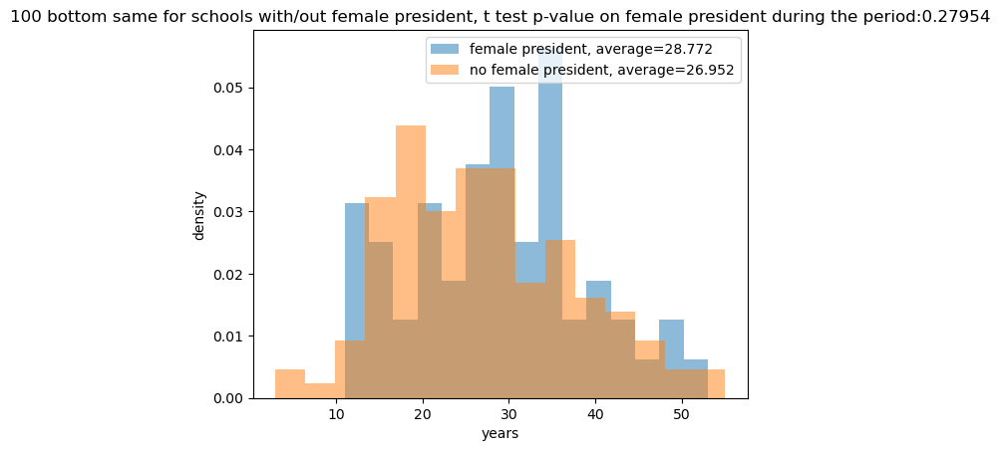

matched t test p-value on women president before 2012:0.00224


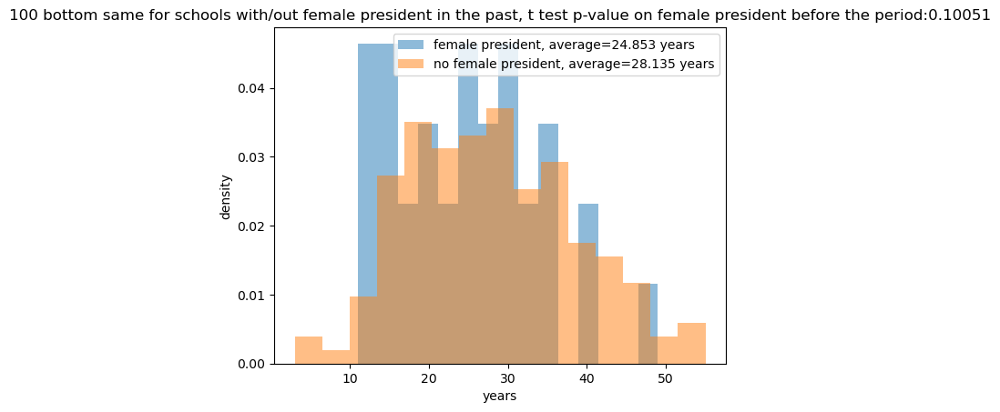

one way anova on REGION : F_onewayResult(statistic=0.6036968308505264, pvalue=0.7523478127511213)
one way anova on LOCALE : F_onewayResult(statistic=1.162747588519506, pvalue=0.32438649246742207)
one way anova on CCUGPROF : F_onewayResult(statistic=3.92284997682106, pvalue=0.00014748512853366973)
one way anova on CCSIZSET : F_onewayResult(statistic=1.9308897109202487, pvalue=0.07828088559806698)
                            OLS Regression Results                            
Dep. Variable:        100 bottom same   R-squared:                       0.065
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     7.327
Date:                Mon, 02 Oct 2023   Prob (F-statistic):            0.00792
Time:                        16:58:05   Log-Likelihood:                -399.70
No. Observations:                 108   AIC:                             803.4
Df Residuals:                     106   BIC:    

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.781853,0.079920
1,REGION,5,8,-1.306562,0.196266
2,REGION,5,7,0.060267,0.952178
3,REGION,5,2,-0.561830,0.575953
4,REGION,5,3,-0.835356,0.406400
5,REGION,5,4,-1.126070,0.264939
6,REGION,5,1,-0.709313,0.481361
7,REGION,6,8,0.397717,0.693064
8,REGION,6,7,1.218168,0.233326
9,REGION,6,2,1.061651,0.293495


In [33]:
var_name = '100 bottom same'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.00859
83
99


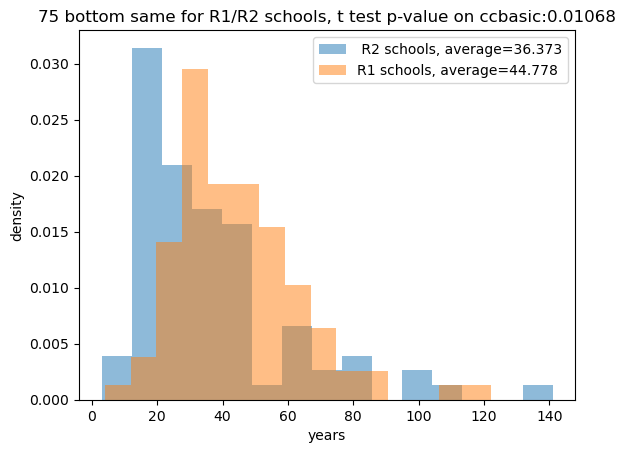

matched t test p-value on control:0.85151


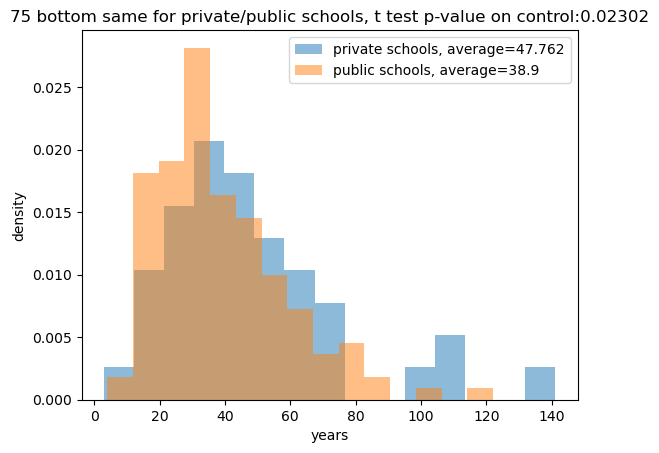

matched t test p-value on control:0.98362


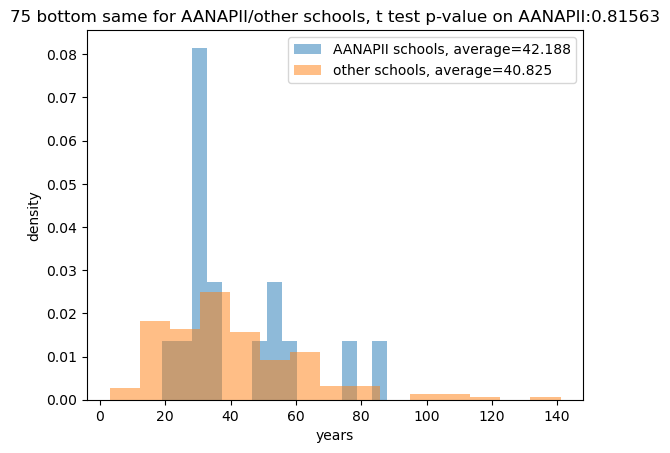

matched t test p-value on control:0.09559


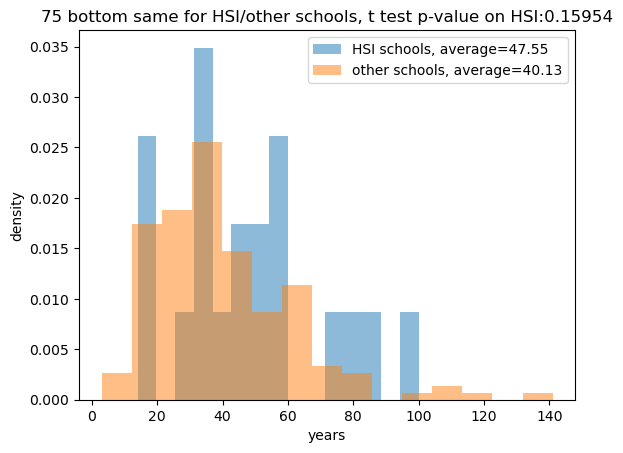

matched t test p-value on women president 2012-2019:0.29458


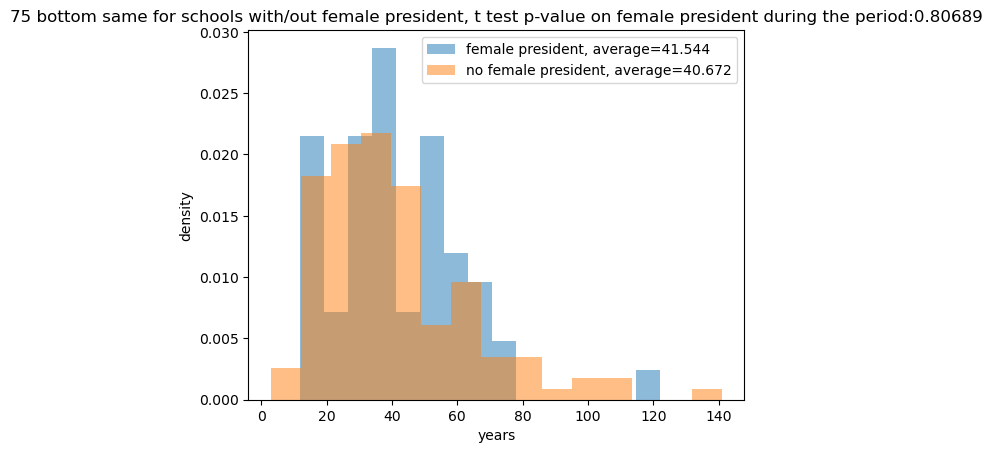

matched t test p-value on women president before 2012:0.0035


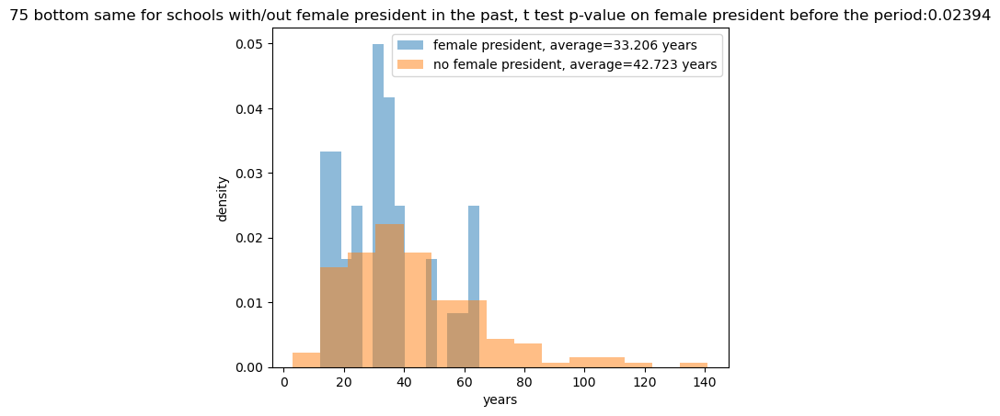

one way anova on REGION : F_onewayResult(statistic=0.928203519469038, pvalue=0.4860576005832269)
one way anova on LOCALE : F_onewayResult(statistic=0.9155732812375894, pvalue=0.5049376286178802)
one way anova on CCUGPROF : F_onewayResult(statistic=1.970136870830321, pvalue=0.04546230929267873)
one way anova on CCSIZSET : F_onewayResult(statistic=2.3167831241760966, pvalue=0.035382969944524924)
                            OLS Regression Results                            
Dep. Variable:         75 bottom same   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     1.662
Date:                Mon, 02 Oct 2023   Prob (F-statistic):              0.200
Time:                        16:58:06   Log-Likelihood:                -481.41
No. Observations:                 108   AIC:                             966.8
Df Residuals:                     106   BIC:      

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.340261,0.022672
1,REGION,5,8,-1.305656,0.196572
2,REGION,5,7,0.213571,0.831733
3,REGION,5,2,-1.126780,0.263526
4,REGION,5,3,-0.592536,0.555429
5,REGION,5,4,-0.833475,0.408118
6,REGION,5,1,-0.924916,0.359366
7,REGION,6,8,0.885815,0.381289
8,REGION,6,7,1.487878,0.147960
9,REGION,6,2,1.100768,0.276269


In [34]:
var_name = '75 bottom same'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0
83
99


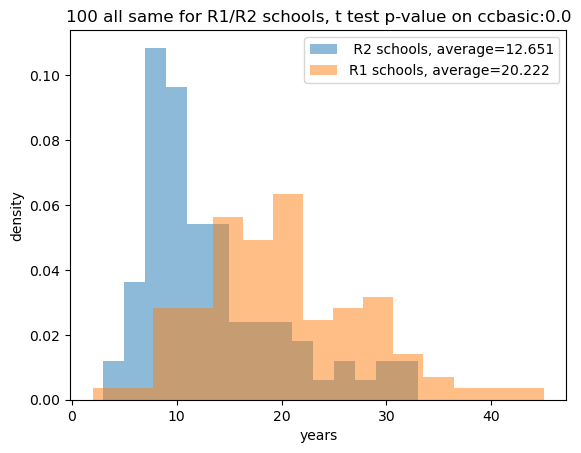

matched t test p-value on control:0.8708


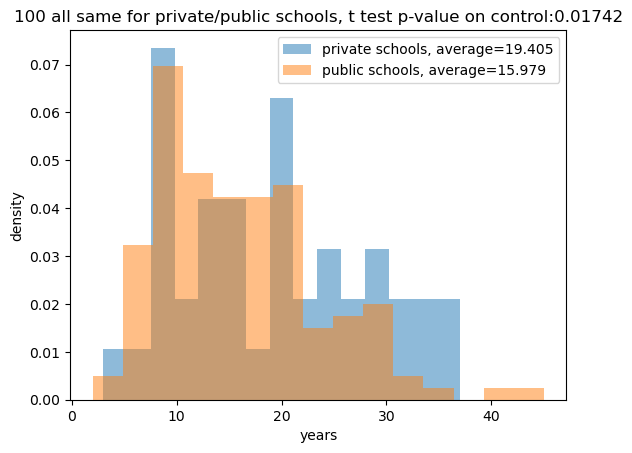

matched t test p-value on control:0.43808


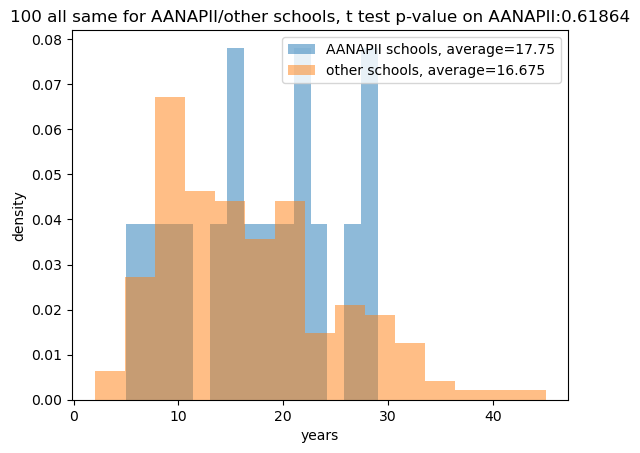

matched t test p-value on control:0.27066


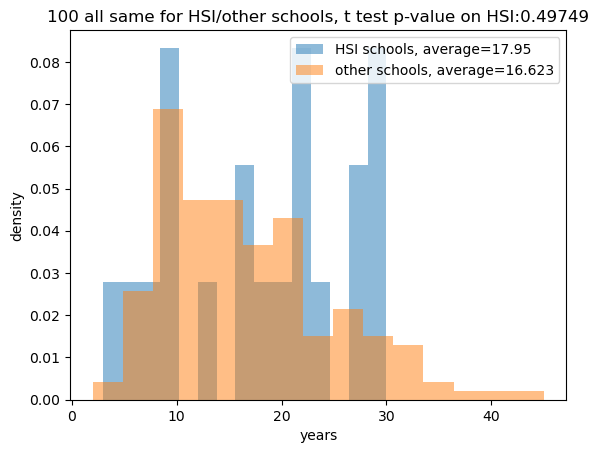

matched t test p-value on women president 2012-2019:0.05884


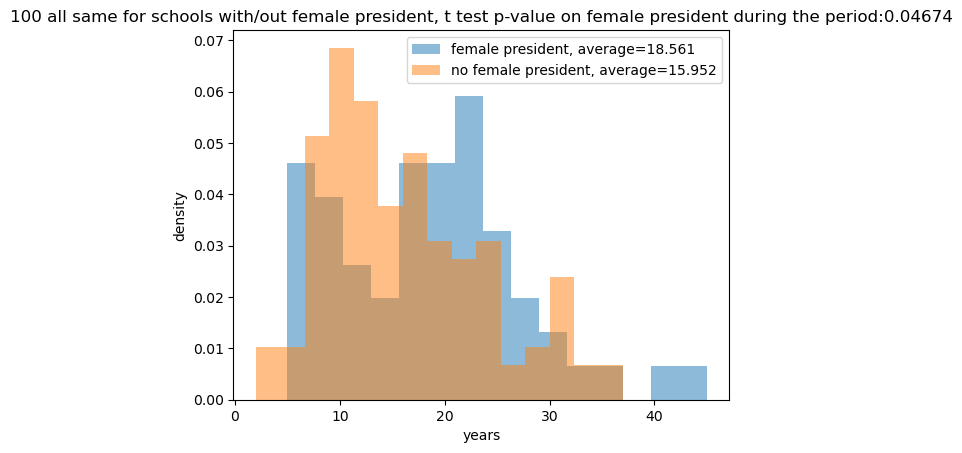

matched t test p-value on women president before 2012:0.04599


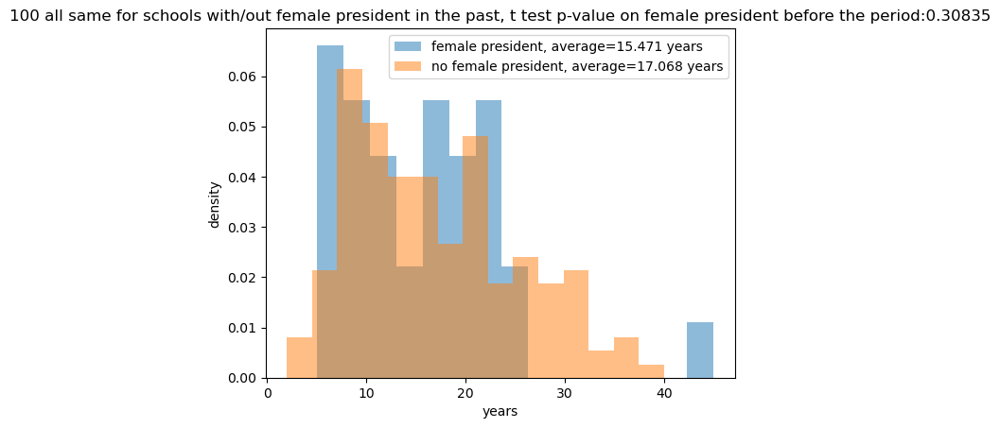

one way anova on REGION : F_onewayResult(statistic=0.7971592599207362, pvalue=0.5906488332119102)
one way anova on LOCALE : F_onewayResult(statistic=1.089318303114587, pvalue=0.3728281364553017)
one way anova on CCUGPROF : F_onewayResult(statistic=5.712845418371863, pvalue=6.351362675493688e-07)
one way anova on CCSIZSET : F_onewayResult(statistic=2.062867805910687, pvalue=0.05989373254924905)
                            OLS Regression Results                            
Dep. Variable:           100 all same   R-squared:                       0.154
Model:                            OLS   Adj. R-squared:                  0.146
Method:                 Least Squares   F-statistic:                     19.29
Date:                Mon, 02 Oct 2023   Prob (F-statistic):           2.67e-05
Time:                        16:58:06   Log-Likelihood:                -371.65
No. Observations:                 108   AIC:                             747.3
Df Residuals:                     106   BIC:      

                            OLS Regression Results                            
Dep. Variable:           100 all same   R-squared:                       0.528
Model:                            OLS   Adj. R-squared:                  0.390
Method:                 Least Squares   F-statistic:                     3.821
Date:                Mon, 02 Oct 2023   Prob (F-statistic):           4.41e-09
Time:                        16:58:06   Log-Likelihood:                -543.42
No. Observations:                 173   AIC:                             1167.
Df Residuals:                     133   BIC:                             1293.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.853525,0.068809
1,REGION,5,8,-1.842990,0.070191
2,REGION,5,7,-0.242298,0.809521
3,REGION,5,2,-0.599865,0.550453
4,REGION,5,3,-0.657948,0.512761
5,REGION,5,4,-0.607924,0.545696
6,REGION,5,1,-0.172987,0.863346
7,REGION,6,8,0.042705,0.966160
8,REGION,6,7,1.003423,0.324250
9,REGION,6,2,1.161285,0.251040


In [35]:
var_name = '100 all same'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.00016
83
99


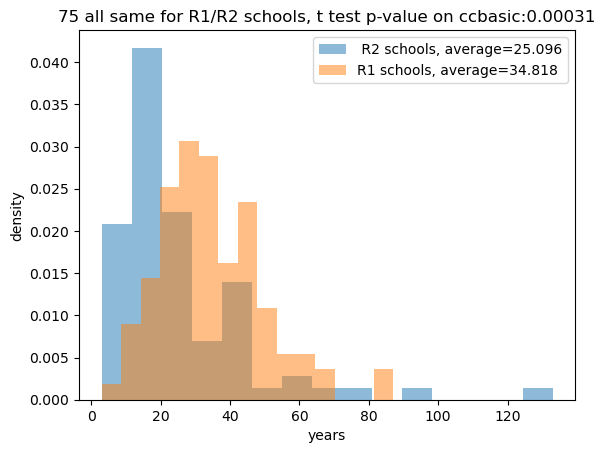

matched t test p-value on control:0.71811


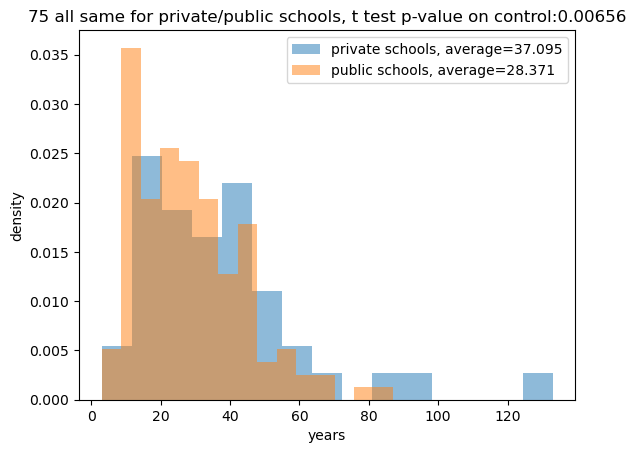

matched t test p-value on control:0.50533


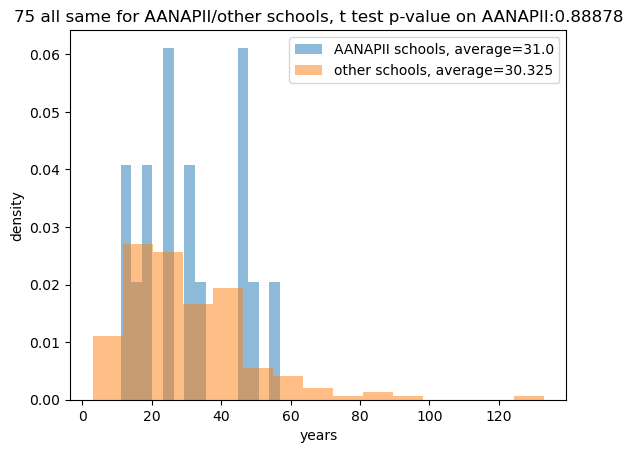

matched t test p-value on control:0.11518


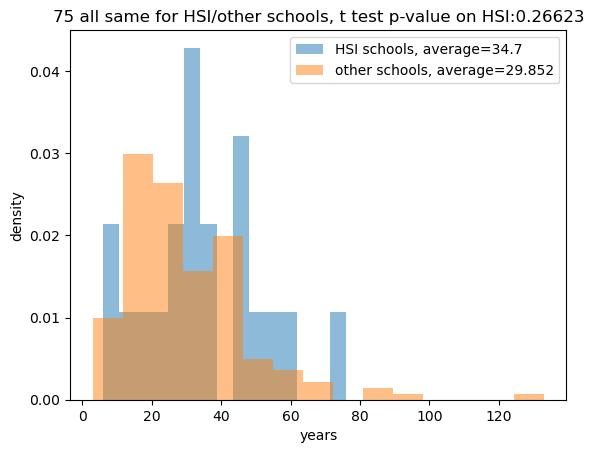

matched t test p-value on women president 2012-2019:0.10558


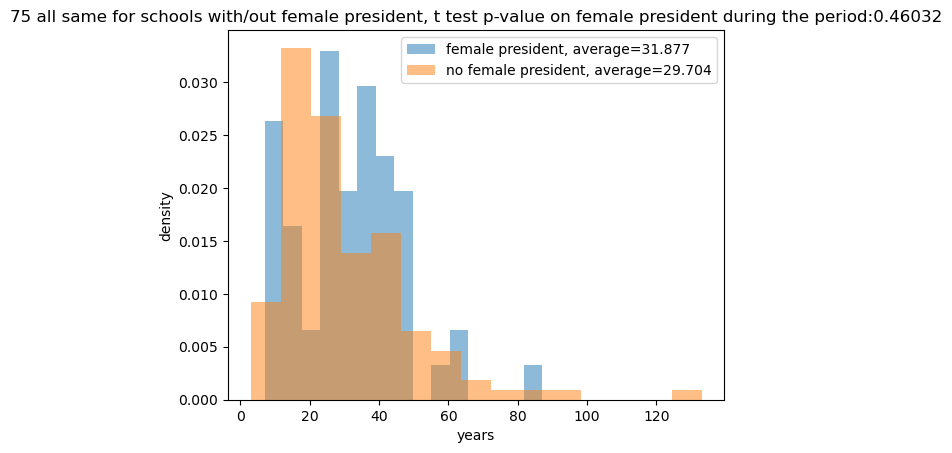

matched t test p-value on women president before 2012:0.00773


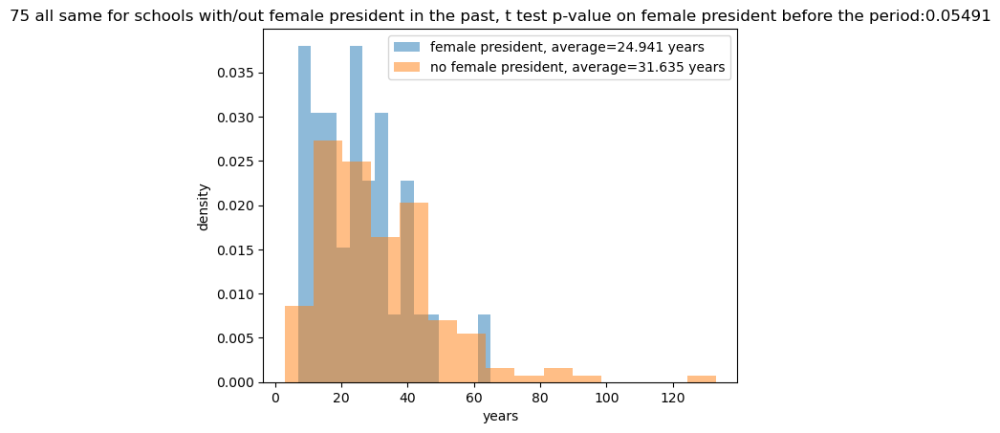

one way anova on REGION : F_onewayResult(statistic=1.204444225916866, pvalue=0.3027006911489431)
one way anova on LOCALE : F_onewayResult(statistic=0.7691846534067253, pvalue=0.6303645920255195)
one way anova on CCUGPROF : F_onewayResult(statistic=2.9066922293884647, pvalue=0.0031544011413073576)
one way anova on CCSIZSET : F_onewayResult(statistic=2.582148574573356, pvalue=0.02015679011412082)
                            OLS Regression Results                            
Dep. Variable:            75 all same   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     4.144
Date:                Mon, 02 Oct 2023   Prob (F-statistic):             0.0443
Time:                        16:58:07   Log-Likelihood:                -466.62
No. Observations:                 108   AIC:                             937.2
Df Residuals:                     106   BIC:     

                            OLS Regression Results                            
Dep. Variable:            75 all same   R-squared:                       0.395
Model:                            OLS   Adj. R-squared:                  0.218
Method:                 Least Squares   F-statistic:                     2.228
Date:                Mon, 02 Oct 2023   Prob (F-statistic):           0.000400
Time:                        16:58:07   Log-Likelihood:                -705.25
No. Observations:                 173   AIC:                             1490.
Df Residuals:                     133   BIC:                             1617.
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.593730,0.011955
1,REGION,5,8,-1.740270,0.086854
2,REGION,5,7,-0.166917,0.868095
3,REGION,5,2,-1.202864,0.232916
4,REGION,5,3,-0.782407,0.436653
5,REGION,5,4,-0.738957,0.463019
6,REGION,5,1,-0.635371,0.528027
7,REGION,6,8,0.905051,0.371141
8,REGION,6,7,1.363604,0.183556
9,REGION,6,2,1.397037,0.168572


In [36]:
var_name = '75 all same'
disp_result(var_name)